<a href="https://colab.research.google.com/github/kiuyha/Audio-Separation-ResUNet-TF-Attention/blob/main/main.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Initialize Cofiguration

In [ ]:
from google.colab import drive

drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [ ]:
!pip install torchmetrics torchcodec torchview torchinfo

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 983.2/983.2 kB 70.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 99.4 MB/s eta 0:00:00


In [ ]:
import json
import random
import torchaudio
import os
import warnings
import shutil
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from torchview import draw_graph
from torchinfo import summary
import torch
import graphviz
from torch.utils.data import Dataset, DataLoader
import numpy as np
import torch.nn as nn
import torchaudio.functional as F
import torchaudio.transforms as T
from torchmetrics.functional.audio import (
  scale_invariant_signal_noise_ratio as si_snr,
  signal_distortion_ratio as sdr,
)
from tqdm import tqdm
from IPython.display import Audio, display

random.seed(42)
torch.manual_seed(42)
np.random.seed(42)

warnings.filterwarnings("ignore", category=UserWarning)

In [ ]:
PROJECT_ROOT = "/content/drive/MyDrive/PSD_Project"
RAW_ROOT = os.path.join(PROJECT_ROOT, "Datasets/Raw/final_0402_1/DCASE2025Task4Dataset/dev_set")
PROCESSED_ROOT = os.path.join(PROJECT_ROOT, "Datasets/Processed")
MODEL_ROOT = os.path.join(PROJECT_ROOT, "Models")

# Dataset Configuration
SELECTED_CLASSES = [
  "Speech",
  "FootSteps",
  "Doorbell",
  "Dishes",
  "AlarmClock"
]

N_MIXTURES = 10_000
MAX_N_SOURCES = 3
DURATION = 10.0
SR = 32000
SNR_RANGE = [5, 20]
TARGET_PEAK = 0.95
MIN_GAIN = 3.0

SPLIT_DATA = {
  'train': {
    'source_event_dir': 'test/oracle_target',
    'source_noise_dir': 'noise/train',
    'split_noise': False,
    'portion': 0.70
  },
  'valid': {
    'source_event_dir': 'sound_event/train',
    'source_noise_dir': 'noise/valid',
    'split_noise': True,
    'noise_portion': 0.50,
    'portion': 0.15
  },
  'test': {
    'source_event_dirs': ['test/oracle_target', 'sound_event/valid'],
    'source_noise_dir': 'noise/valid',
    'split_noise': True,
    'noise_portion': 0.50,
    'portion': 0.15
  }
}

# Spectogram Configuration
N_MELS = 128
N_FFT = 2048
HOP_LENGTH = 512

# Training Configuration
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'
print(f"Using device: {DEVICE}")
BATCH_SIZE = 32
LEARNING_RATE = 1e-4
EPOCHS = 50
PATIENCE_EARLY_STOP = 15
PATIENCE_LR_REDUCE = 1.5
FACTOR_OPTIMIZER = 0.9

Using device: cuda


In [ ]:
os.makedirs(PROCESSED_ROOT, exist_ok=True)
os.makedirs(MODEL_ROOT, exist_ok=True)

In [ ]:
def load_audio(filepath, target_sr=SR):
  try:
    waveform, sr = torchaudio.load(filepath)

    # Ensure 2D tensor [channels, samples]
    if waveform.dim() == 1:
      waveform = waveform.unsqueeze(0)

    # Resample if necessary
    if sr != target_sr:
      waveform = F.resample(waveform, sr, target_sr)

    # Convert to mono
    if waveform.shape[0] > 1:
      waveform = torch.mean(waveform, dim=0, keepdim=True)

    return waveform
  except Exception as e:
    print(f"Error loading {filepath}: {e}")
    return None

# Dataset

## Get the Raw Dataset
The dataset comes from [DCASE](https://zenodo.org/records/15117227). The datasets contains clear audio from 18 event class, RIR (Room Impulse Responses) and Noise.

In [ ]:
# download the list of dataset links
!wget https://github.com/nttcslab/dcase2025_task4_baseline/raw/refs/heads/main/dev_set_zenodo.txt

--2025-11-10 17:10:31--  https://github.com/nttcslab/dcase2025_task4_baseline/raw/refs/heads/main/dev_set_zenodo.txt
Resolving github.com (github.com)... 140.82.114.4
Connecting to github.com (github.com)|140.82.114.4|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/nttcslab/dcase2025_task4_baseline/refs/heads/main/dev_set_zenodo.txt [following]
--2025-11-10 17:10:31--  https://raw.githubusercontent.com/nttcslab/dcase2025_task4_baseline/refs/heads/main/dev_set_zenodo.txt
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1230 (1.2K) [text/plain]
Saving to: ‘dev_set_zenodo.txt’

dev_set_zenodo.txt  100%[===================>]   1.20K  --.-KB/s    in 0s      

2025-11-10 17:10:31 (52.8 MB/s) - ‘dev_se

In [ ]:
# Download all the dataset that is multi-part zip
!wget -i dev_set_zenodo.txt

In [ ]:
# Make them into one ZIP
!zip -s 0 DCASE2025Task4Dataset.zip --out "/content/drive/MyDrive/PSD_Project/Datasets/Raw/unsplit.zip"

In [ ]:
# Unzip the dataset
!unzip "/content/drive/MyDrive/PSD_Project/Datasets/Raw/unsplit.zip" -d "/content/drive/MyDrive/PSD_Project/Datasets/Raw/"

Streaming output truncated to the last 5000 lines.
  inflating: /content/drive/MyDrive/PSD_Project/Datasets/Raw/final_0402_1/DCASE2025Task4Dataset/dev_set/test/oracle_target/dev_test_1306_Clapping.wav  
  inflating: /content/drive/MyDrive/PSD_Project/Datasets/Raw/final_0402_1/DCASE2025Task4Dataset/dev_set/test/oracle_target/dev_test_1307_Buzzer.wav  
  inflating: /content/drive/MyDrive/PSD_Project/Datasets/Raw/final_0402_1/DCASE2025Task4Dataset/dev_set/test/oracle_target/dev_test_1307_FootSteps.wav  
  inflating: /content/drive/MyDrive/PSD_Project/Datasets/Raw/final_0402_1/DCASE2025Task4Dataset/dev_set/test/oracle_target/dev_test_1308_Dishes.wav  
  inflating: /content/drive/MyDrive/PSD_Project/Datasets/Raw/final_0402_1/DCASE2025Task4Dataset/dev_set/test/oracle_target/dev_test_1308_Doorbell.wav  
  inflating: /content/drive/MyDrive/PSD_Project/Datasets/Raw/final_0402_1/DCASE2025Task4Dataset/dev_set/test/oracle_target/dev_test_1308_HairDryer.wav  
  inflating: /content/drive/MyDrive/PSD

In [ ]:
# show the files structure
!apt-get install tree
!cd /content/drive/MyDrive/PSD_Project/Datasets/Raw && tree -L 5

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
tree is already the newest version (2.0.2-1).
0 upgraded, 0 newly installed, 0 to remove and 41 not upgraded.
.
├── final_0402_1
│   └── DCASE2025Task4Dataset
│       ├── dev_set
│       │   ├── config
│       │   │   ├── EARS_config.json
│       │   │   └── FSD50K_config.json
│       │   ├── metadata
│       │   │   ├── valid
│       │   │   └── valid.json
│       │   ├── noise
│       │   │   ├── train
│       │   │   └── valid
│       │   ├── room_ir
│       │   │   ├── train
│       │   │   └── valid
│       │   ├── sound_event
│       │   │   ├── train
│       │   │   └── valid
│       │   └── test
│       │       ├── oracle_target
│       │       └── soundscape
│       └── eval_set
└── unsplit.zip

19 directories, 4 files


## Processing Dataset
The size is 14 GB not include the mixture that will be make, which is not feasible to use in free tier Google Colab. Therefore, I'll decrease the size into 10K mixture and 5 class.

The varible is ensure to be as close as the DCASE2025 configuration. You can check the configuration in [here](https://github.com/nttcslab/dcase2025_task4_baseline/blob/12063c5219cab094826e839be9a9bd095a6b441c/config/label/m2dat_head.yaml#L26).

In [ ]:
print("Collecting audio files...")

AUDIO_EXTS = ('.wav', '.flac', '.mp3', '.sofa')
event_files = {}
noise_files = {}

def copy_audio_files(old_path, new_path, file_list=None):
  if not os.path.isdir(old_path):
    return []

  os.makedirs(new_path, exist_ok=True)
  copied = []

  files_to_process = file_list if file_list else os.listdir(old_path)

  for f in files_to_process:
    if not f.lower().endswith(AUDIO_EXTS):
      continue

    old_file = os.path.join(old_path, f)
    new_file = os.path.join(new_path, f)
    shutil.copy(old_file, new_file)
    copied.append(new_file)

  return copied

print("Pre-processing flat 'test/oracle_target' directory...")
oracle_source_path = os.path.join(RAW_ROOT, 'test/oracle_target')
oracle_files_by_class = {}

if os.path.isdir(oracle_source_path):
  all_oracle_files = [f for f in os.listdir(oracle_source_path) if f.lower().endswith(AUDIO_EXTS)]
  random.shuffle(all_oracle_files)

  for cls in SELECTED_CLASSES:
    # Filter files for this class from the flat list
    class_files = [f for f in all_oracle_files if cls.lower() in f.lower()]

    # Split the list 70%/30% for train/test as defined in SPLIT_DATA
    total = len(class_files)
    split_idx = int(total * 0.7)

    # Store the *filenames* to be used by 'train' and 'test' splits
    oracle_files_by_class[cls] = {
      'train': class_files[:split_idx],
      'test': class_files[split_idx:]
    }
else:
  print(f"Warning: 'test/oracle_target' directory not found: {oracle_source_path}")

print("Pre-processing 'noise/valid' directory...")
noise_valid_files = {}
noise_valid_path = os.path.join(RAW_ROOT, 'noise/valid')
if os.path.isdir(noise_valid_path):
  all_noise = [f for f in os.listdir(noise_valid_path) if f.lower().endswith(AUDIO_EXTS)]
  random.shuffle(all_noise)
  mid = len(all_noise) // 2
  noise_valid_files['valid'] = all_noise[:mid]
  noise_valid_files['test'] = all_noise[mid:]

for split, data in SPLIT_DATA.items():
  event_files[split] = {}
  noise_files[split] = []

  for cls in SELECTED_CLASSES:
    new_cls_path = os.path.join(PROCESSED_ROOT, 'sound_event', split, cls)
    os.makedirs(new_cls_path, exist_ok=True)
    files = []

    # Unify source_event_dirs and source_event_dir for simpler looping
    source_dirs = data.get('source_event_dirs', [])
    if 'source_event_dir' in data:
      source_dirs.append(data['source_event_dir'])

    for source_dir in source_dirs:

      if source_dir == 'test/oracle_target':
        if cls in oracle_files_by_class and split in oracle_files_by_class[cls]:
          selected_files = oracle_files_by_class[cls][split]
          old_source_path = os.path.join(RAW_ROOT, source_dir)

          for f in selected_files:
            old_file = os.path.join(old_source_path, f)
            new_file = os.path.join(new_cls_path, f)
            if os.path.exists(old_file):
              shutil.copy(old_file, new_file)
              files.append(new_file)

      else:
        old_cls_path = os.path.join(RAW_ROOT, source_dir, cls)
        copied = copy_audio_files(old_cls_path, new_cls_path)
        files.extend(copied)

    event_files[split][cls] = files

  # Noise file copying (unchanged)
  old_noise = os.path.join(RAW_ROOT, data['source_noise_dir'])
  new_noise = os.path.join(PROCESSED_ROOT, 'noise', split)

  if data.get('split_noise') and split in noise_valid_files:
    noise_files[split] = copy_audio_files(old_noise, new_noise, file_list=noise_valid_files[split])
  else:
    noise_files[split] = copy_audio_files(old_noise, new_noise)

# Final report (unchanged)
if not any(event_files.values()):
  raise ValueError("No event files found. Check RAW_ROOT and SELECTED_CLASSES.")

total_events = sum(len(f) for cls_files in event_files.values() for f in cls_files.values())
total_noise = sum(len(f) for f in noise_files.values())

print(f"Event files: {total_events}")
for split, classes in event_files.items():
  class_counts = ", ".join([f'{cls}: {len(files)}' for cls, files in classes.items()])
  total_split = sum(len(files) for files in classes.values())
  print(f"  {split}: {total_split} ({class_counts})")

noise_dist = ", ".join([f'{k}: {len(v)}' for k, v in noise_files.items()])
print(f"Noise files: {total_noise} ({noise_dist})")

Pre-processing flat 'test/oracle_target' directory...
Pre-processing 'noise/valid' directory...
Event files: 1173
  train: 556 (Speech: 106, FootSteps: 129, Doorbell: 114, Dishes: 93, AlarmClock: 114)
  valid: 320 (Speech: 16, FootSteps: 90, Doorbell: 12, Dishes: 142, AlarmClock: 60)
  test: 297 (Speech: 50, FootSteps: 68, Doorbell: 53, Dishes: 65, AlarmClock: 61)
Noise files: 80 (train: 59, valid: 10, test: 11)


In [ ]:
# Create output directories
for split in SPLIT_DATA.keys():
  os.makedirs(f"{PROCESSED_ROOT}/mixtures/{split}", exist_ok=True)
os.makedirs(f"{PROCESSED_ROOT}/metadata", exist_ok=True)

In [ ]:
def create_background(noise_files, sr, duration):
  bg_audio = torch.zeros(1, int(sr * duration))
  bg_events = []

  if noise_files:
    noise_path = random.choice(noise_files)
    print(f"Noise file: {noise_path}")
    noise_audio_raw = load_audio(noise_path, sr)
    if noise_audio_raw is not None:
      # Apply random gain for background
      noise_db = random.uniform(-30, -18)
      noise_lin = 10 ** (noise_db / 20.0)
      bg_audio_processed = noise_audio_raw * noise_lin

      # Pad or truncate to exact duration
      pad_len = bg_audio.shape[1] - bg_audio_processed.shape[1]
      if pad_len > 0:
        bg_audio_processed = torch.nn.functional.pad(bg_audio_processed, (0, pad_len))
      else:
        bg_audio_processed = bg_audio_processed[:, :bg_audio.shape[1]]

      bg_events.append({
        "label": None,
        "source_file": noise_path.removeprefix(PROCESSED_ROOT).lstrip('/'),
        "source_time": 0.0,
        "event_time": 0.0,
        "event_duration": float(duration),
        "snr": 0.0,
        "role": "background",
      })

  return bg_audio_processed, bg_events

In [ ]:
def create_foreground_layer(event_files, n_sources, sr, duration, noise_power):
  fg_layer = torch.zeros(1, int(sr * duration))
  fg_events = []
  room_rir = None

  available_classes = list(event_files.keys())
  selected_classes = random.sample(available_classes, min(n_sources, len(available_classes)))

  for j, source_class in enumerate(selected_classes):
    class_files = event_files[source_class]
    if not class_files:
      continue

    event_path = random.choice(class_files)
    event_audio = load_audio(event_path, sr)
    if event_audio is None:
      continue

    print(f"Target file: {event_path}")

    # Calculate clean event power
    event_power = torch.mean(event_audio ** 2) + 1e-8

    # Pick a target SNR in dB
    snr_db = random.uniform(*SNR_RANGE)

    # Calculate the required gain
    snr_linear = 10 ** (snr_db / 10.0)
    gain_lin = torch.sqrt((noise_power * snr_linear) / event_power )

    # Apply calculated gain
    event_audio_scaled = event_audio * gain_lin

    # Random onset time
    event_duration = event_audio_scaled.shape[1]
    max_start = max(0, int(sr * duration) - event_duration)
    start_sample = random.randint(0, max_start)

    # Add to foreground layer
    end_sample = min(start_sample + event_duration, fg_layer.shape[1])
    actual_duration = end_sample - start_sample
    fg_layer[:, start_sample:end_sample] += event_audio_scaled[:, :actual_duration]

    # Store foreground event metadata
    fg_events.append({
      "label": source_class,
      "source_file": event_path.removeprefix(PROCESSED_ROOT).lstrip('/'),
      "source_time": 0.0,
      "event_time": round(start_sample / sr, 6),
      "event_duration": round(actual_duration / sr, 6),
      "snr": round(snr_db, 6),
      "role": "foreground",
    })

  return fg_layer, fg_events

In [ ]:
# Calculate dataset splits
n_train = int(N_MIXTURES * SPLIT_DATA['train']['portion'])
n_val = int(N_MIXTURES * SPLIT_DATA['valid']['portion'])
n_test = N_MIXTURES - n_train - n_val

splits = (['train'] * n_train) + (['valid'] * n_val) + (['test'] * n_test)
random.shuffle(splits)

# Generate mixtures
print(f"Generating {N_MIXTURES} mixtures...")
metadata_all = []

for i, split in enumerate(splits, start=1):
  mixture_id = f"mixture_{i:06d}"
  print("-" * 20, mixture_id, "-" * 20)

  bg_audio, bg_events = create_background(noise_files[split], SR, DURATION)

  # Calculate noise power for SNR
  noise_power = torch.mean(bg_audio ** 2) + 1e-8

  n_sources = random.randint(1, MAX_N_SOURCES)

  fg_layer, fg_events = create_foreground_layer(
    event_files[split], n_sources, SR, DURATION, noise_power
  )

  mixture = bg_audio + fg_layer
  # Normalize to prevent clipping
  current_peak = torch.max(torch.abs(mixture)).item() + 1e-8
  gain_to_target = TARGET_PEAK / current_peak
  gain = min(gain_to_target, MIN_GAIN)
  mixture = mixture * gain

  # Save mixture audio
  mixture_path = os.path.join(PROCESSED_ROOT, "mixtures", split, f"{mixture_id}.wav")
  torchaudio.save(mixture_path, mixture, SR)
  print(f"Mixture save in {mixture_path}")

  # Compile full metadata
  metadata_entry = {
    "mixture_id": mixture_id,
    "mixture_path": mixture_path.removeprefix(PROCESSED_ROOT).lstrip('/'),
    "split": split,
    "config": {
      "duration": float(DURATION),
      "sr": SR,
      "max_event_overlap": MAX_N_SOURCES,
      "ref_channel": 0,
    },
    "fg_events": fg_events,
    "bg_events": bg_events,
    "int_events": [],
    "normalization_gain": gain,
    "original_peak": current_peak
  }

  metadata_all.append(metadata_entry)

# Save metadata to JSONL
metadata_path = os.path.join(PROCESSED_ROOT, "metadata", "mixtures_metadata.jsonl")
with open(metadata_path, 'w') as f:
  for item in metadata_all:
    f.write(f"{json.dumps(item)}\n")

# Save split-specific metadata
for split in SPLIT_DATA.keys():
  split_metadata = [m for m in metadata_all if m['split'] == split]
  split_path = os.path.join(PROCESSED_ROOT, "metadata", f"{split}_metadata.jsonl")
  with open(split_path, 'w') as f:
    for item in split_metadata:
      f.write(f"{json.dumps(item)}\n")

# Print summary
total_fg_events = sum(len(m['fg_events']) for m in metadata_all)
avg_sources = total_fg_events / len(metadata_all)
print(f"\nDataset created at {PROCESSED_ROOT}")
print(f"Mixtures: {N_MIXTURES} | Avg sources per mixture: {avg_sources:.1f}")
print(f"Metadata saved to {metadata_path}")
print(f"Split metadata saved to {PROCESSED_ROOT}/metadata/")

Streaming output truncated to the last 5000 lines.
-------------------- mixture_009006 --------------------
Noise file: /content/drive/MyDrive/PSD_Project/Datasets/Processed/noise/train/foa-meir_reverb-s_pid0060_BG.wav
Target file: /content/drive/MyDrive/PSD_Project/Datasets/Processed/sound_event/train/Dishes/dev_test_1056_Dishes.wav
Target file: /content/drive/MyDrive/PSD_Project/Datasets/Processed/sound_event/train/Doorbell/dev_test_1299_Doorbell.wav
Mixture save in /content/drive/MyDrive/PSD_Project/Datasets/Processed/mixtures/train/mixture_009006.wav
-------------------- mixture_009007 --------------------
Noise file: /content/drive/MyDrive/PSD_Project/Datasets/Processed/noise/test/foa-meir_reverb-s_pid0089_BG.wav
Target file: /content/drive/MyDrive/PSD_Project/Datasets/Processed/sound_event/test/Speech/dev_test_1157_Speech.wav
Target file: /content/drive/MyDrive/PSD_Project/Datasets/Processed/sound_event/test/AlarmClock/dev_test_0818_AlarmClock.wav
Target file: /content/drive/MyDr

## Visualization Final Dataset

In [ ]:
metadata = []

with open(os.path.join(PROCESSED_ROOT, "metadata/mixtures_metadata.jsonl"), 'r') as f:
  for line in f:
    metadata.append(json.loads(line))

print(f"Loaded {len(metadata)} total mixture entries.")

mixture_data_list = []
event_data_list = []

for mixture in metadata:
  # Mixture-level data
  mixture_data_list.append({
    'mixture_id': mixture['mixture_id'],
    'split': mixture['split'],
    'n_fg_events': len(mixture['fg_events']),
    'n_bg_events': len(mixture['bg_events']),
  })

  # Event-level data (flattened)
  for event in mixture['fg_events']:
    event_data_list.append({
    'mixture_id': mixture['mixture_id'],
    'split': mixture['split'],
    'label': event['label'],
    'snr': event['snr'],
    'event_time': event['event_time'],
    'event_duration': event['event_duration']
  })

mixture_df = pd.DataFrame(mixture_data_list)
event_df = pd.DataFrame(event_data_list)

print("Data processing complete.")
print(f"Created mixture_df with {len(mixture_df)} rows.")
print(f"Created event_df with {len(event_df)} rows.")

Loaded 10000 total mixture entries.
Data processing complete.
Created mixture_df with 10000 rows.
Created event_df with 20025 rows.


In [ ]:
split_counts = mixture_df['split'].value_counts().reset_index()
split_counts.columns = ['split', 'count']

fig = px.pie(
  split_counts,
  values='count',
  names='split',
  title=f'Mixture Distribution by Split (Total = {len(mixture_df)})',
  color_discrete_sequence=px.colors.sequential.Viridis
)

fig.update_traces(textposition='inside', textinfo='percent+label+value')
fig.show()

In [ ]:
fig = px.histogram(
  event_df,
  x='snr',
  nbins=50,
  title='SNR Distribution for Foreground Events'
)

fig.update_layout(
  xaxis_title='SNR (dB)',
  yaxis_title='Frequency (Count)',
  shapes=[
      dict(type='line', x0=5, x1=5, y0=0, y1=1, yref='paper', line=dict(color='red', dash='dash')),
      dict(type='line', x0=20, x1=20, y0=0, y1=1, yref='paper', line=dict(color='red', dash='dash'))
  ]
)

fig.show()

In [ ]:
fig = px.bar(
  mixture_df['n_fg_events'].value_counts().reset_index(),
  x='n_fg_events',
  y='count',
  title='Number of Foreground Sources per Mixture'
)

fig.update_layout(xaxis_title='Number of Sources', yaxis_title='Number of Mixtures')
fig.show()

In [ ]:
grouped_df = (
  event_df
  .groupby(['label', 'split'])
  .size()
  .reset_index(name='count')
)

fig = px.bar(
  grouped_df,
  x='split',
  y='count',
  color='label',
  barmode='group',
  title='Foreground Event Distribution by Class and Split'
)

fig.update_layout(xaxis_title='Event Class', yaxis_title='Number of Events')
fig.show()

## Publish the Final Dataset

In [ ]:
from huggingface_hub import HfApi
from google.colab import userdata

api = HfApi(token=userdata.get("HF_TOKEN"))
api.upload_large_folder(
  folder_path=PROCESSED_ROOT,
  repo_id="Kiuyha/dcase-5class-3source-mixtures-32k",
  repo_type="dataset",
)

Recovering from metadata files:   0%|          | 0/11257 [00:00<?, ?it/s]




---------- 2025-11-16 22:47:06 (0:00:00) ----------
Files:   hashed 0/11257 (0.0/12.1G) | pre-uploaded: 0/0 (0.0/12.1G) (+11257 unsure) | committed: 0/11257 (0.0/12.1G) | ignored: 0
Workers: hashing: 2 | get upload mode: 0 | pre-uploading: 0 | committing: 0 | waiting: 0
---------------------------------------------------


Processing Files (0 / 0)      : |          |  0.00B /  0.00B            

New Data Upload               : |          |  0.00B /  0.00B            

  .../dev_test_1237_Speech.wav:  59%|#####9    |  378kB /  640kB            

  .../dev_test_0738_Speech.wav: 100%|##########|  640kB /  640kB            

  .../dev_test_1087_Speech.wav: 100%|##########|  640kB /  640kB            

  .../dev_test_0915_Speech.wav: 100%|##########|  640kB /  640kB            

  .../dev_test_1330_Speech.wav: 100%|##########|  640kB /  640kB            

  .../dev_test_0567_Speech.wav: 100%|##########|  640kB /  640kB            

  .../dev_test_0212_Speech.wav: 100%|##########|  640kB /  640kB            

  .../dev_test_0030_Speech.wav: 100%|##########|  640kB /  640kB            

  .../dev_test_0278_Speech.wav: 100%|##########|  640kB /  640kB            

  .../dev_test_1102_Speech.wav: 100%|##########|  640kB /  640kB            

Processing Files (0 / 0)      : |          |  0.00B /  0.00B            

New Data Upload               : |          |  0.00B /  0.00B            

  .../dev_test_0915_Speech.wav: 100%|##########|  640kB /  640kB            

  .../dev_test_0192_Speech.wav: 100%|##########|  640kB /  640kB            

  .../dev_test_0228_Speech.wav: 100%|##########|  640kB /  640kB            

  .../dev_test_0352_Speech.wav: 100%|##########|  640kB /  640kB            

  .../dev_test_0973_Speech.wav: 100%|##########|  640kB /  640kB            

  .../dev_test_1087_Speech.wav: 100%|##########|  640kB /  640kB            

  .../dev_test_1087_Speech.wav: 100%|##########|  640kB /  640kB            

  .../dev_test_1155_Speech.wav: 100%|##########|  640kB /  640kB            

  .../dev_test_1155_Speech.wav: 100%|##########|  640kB /  640kB            

  .../dev_test_0738_Speech.wav: 100%|##########|  640kB /  640kB            

  .../dev_test_0738_Speech.wav: 100%|##########|  640kB /  640kB            

  .../dev_test_0034_Speech.wav: 100%|##########|  640kB /  640kB            

  .../dev_test_1369_Speech.wav: 100%|##########|  640kB /  640kB            

  .../dev_test_1369_Speech.wav: 100%|##########|  640kB /  640kB            


---------- 2025-11-16 22:48:06 (0:01:00) ----------
Files:   hashed 561/11257 (373.6M/12.1G) | pre-uploaded: 256/461 (163.9M/12.1G) (+10792 unsure) | committed: 0/11257 (0.0/12.1G) | ignored: 0
Workers: hashing: 1 | get upload mode: 0 | pre-uploading: 0 | committing: 1 | waiting: 0
---------------------------------------------------
                             

Processing Files (0 / 0)      : |          |  0.00B /  0.00B            

New Data Upload               : |          |  0.00B /  0.00B            

  .../dev_test_0146_Speech.wav: 100%|##########|  640kB /  640kB            

  .../dev_test_1264_Speech.wav: 100%|##########|  640kB /  640kB            

  .../dev_test_1047_Speech.wav: 100%|##########|  640kB /  640kB            

  .../dev_test_0926_Speech.wav: 100%|##########|  640kB /  640kB            

  .../dev_test_0037_Speech.wav: 100%|##########|  640kB /  640kB            

  .../dev_test_1189_Speech.wav: 100%|##########|  640kB /  640kB            

  .../dev_test_1461_Speech.wav: 100%|##########|  640kB /  640kB            

  .../dev_test_0586_Speech.wav: 100%|##########|  640kB /  640kB            

  .../dev_test_0687_Speech.wav: 100%|##########|  640kB /  640kB            

  .../dev_test_1338_Speech.wav: 100%|##########|  640kB /  640kB            

Processing Files (0 / 0)      : |          |  0.00B /  0.00B            

New Data Upload               : |          |  0.00B /  0.00B            

  ...ev_test_0865_Doorbell.wav: 100%|##########|  640kB /  640kB            

  ...ev_test_1394_Doorbell.wav: 100%|##########|  640kB /  640kB            

  ...ev_test_0860_Doorbell.wav: 100%|##########|  640kB /  640kB            

  ...ev_test_0324_Doorbell.wav: 100%|##########|  640kB /  640kB            

  ...ev_test_1340_Doorbell.wav: 100%|##########|  640kB /  640kB            

  ...ev_test_0011_Doorbell.wav: 100%|##########|  640kB /  640kB            

  ...ev_test_0488_Doorbell.wav: 100%|##########|  640kB /  640kB            

  ...ev_test_0424_Doorbell.wav: 100%|##########|  640kB /  640kB            

  ...ev_test_1021_Doorbell.wav: 100%|##########|  640kB /  640kB            

  ...ev_test_0094_Doorbell.wav: 100%|##########|  640kB /  640kB            

Processing Files (0 / 0)      : |          |  0.00B /  0.00B            

New Data Upload               : |          |  0.00B /  0.00B            

  ...v_test_0306_FootSteps.wav: 100%|##########|  640kB /  640kB            

  ...v_test_0079_FootSteps.wav: 100%|##########|  640kB /  640kB            

  ...v_test_1482_FootSteps.wav: 100%|##########|  640kB /  640kB            

  ...v_test_0012_FootSteps.wav: 100%|##########|  640kB /  640kB            

  ...v_test_0173_FootSteps.wav: 100%|##########|  640kB /  640kB            

  ...v_test_0870_FootSteps.wav: 100%|##########|  640kB /  640kB            

  ...v_test_0660_FootSteps.wav: 100%|##########|  640kB /  640kB            

  ...v_test_0734_FootSteps.wav: 100%|##########|  640kB /  640kB            

  ...v_test_1313_FootSteps.wav: 100%|##########|  640kB /  640kB            

  ...v_test_0406_FootSteps.wav: 100%|##########|  640kB /  640kB            

Processing Files (0 / 0)      : |          |  0.00B /  0.00B            

New Data Upload               : |          |  0.00B /  0.00B            

  ...v_test_0197_FootSteps.wav: 100%|##########|  640kB /  640kB            

  ...v_test_0555_FootSteps.wav: 100%|##########|  640kB /  640kB            

  ...v_test_0681_FootSteps.wav: 100%|##########|  640kB /  640kB            

  ...v_test_0170_FootSteps.wav: 100%|##########|  640kB /  640kB            

  ...ev_test_0871_Doorbell.wav: 100%|##########|  640kB /  640kB            

  ...ev_test_1185_Doorbell.wav: 100%|##########|  640kB /  640kB            

  ...ev_test_0688_Doorbell.wav: 100%|##########|  640kB /  640kB            

  ...v_test_0830_FootSteps.wav: 100%|##########|  640kB /  640kB            

  ...ev_test_0527_Doorbell.wav: 100%|##########|  640kB /  640kB            

  ...v_test_0553_FootSteps.wav: 100%|##########|  640kB /  640kB            

Processing Files (0 / 0)      : |          |  0.00B /  0.00B            

New Data Upload               : |          |  0.00B /  0.00B            


---------- 2025-11-16 22:49:07 (0:02:00) ----------
Files:   hashed 865/11257 (560.5M/12.1G) | pre-uploaded: 512/846 (327.7M/12.1G) (+10407 unsure) | committed: 350/11257 (238.9M/12.1G) | ignored: 0
Workers: hashing: 0 | get upload mode: 1 | pre-uploading: 0 | committing: 1 | waiting: 0
---------------------------------------------------
                             

  ...ev_test_0026_Doorbell.wav: 100%|##########|  640kB /  640kB            

  ...ev_test_1141_Doorbell.wav: 100%|##########|  640kB /  640kB            

  ...ev_test_1253_Doorbell.wav: 100%|##########|  640kB /  640kB            

  .../dev_test_0260_Dishes.wav: 100%|##########|  640kB /  640kB            

  .../dev_test_0758_Dishes.wav: 100%|##########|  640kB /  640kB            

  .../dev_test_0288_Dishes.wav: 100%|##########|  640kB /  640kB            

  .../dev_test_1187_Dishes.wav: 100%|##########|  640kB /  640kB            

  .../dev_test_1218_Dishes.wav: 100%|##########|  640kB /  640kB            

  .../dev_test_0828_Dishes.wav: 100%|##########|  640kB /  640kB            

  .../dev_test_1196_Dishes.wav: 100%|##########|  640kB /  640kB            

Processing Files (0 / 0)      : |          |  0.00B /  0.00B            

New Data Upload               : |          |  0.00B /  0.00B            

  ..._test_1190_AlarmClock.wav: 100%|##########|  640kB /  640kB            

  ..._test_1078_AlarmClock.wav: 100%|##########|  640kB /  640kB            

  ..._test_1465_AlarmClock.wav: 100%|##########|  640kB /  640kB            

  ..._test_0321_AlarmClock.wav: 100%|##########|  640kB /  640kB            

  ..._test_0303_AlarmClock.wav: 100%|##########|  640kB /  640kB            

  ..._test_0709_AlarmClock.wav: 100%|##########|  640kB /  640kB            

  ..._test_1315_AlarmClock.wav: 100%|##########|  640kB /  640kB            

  ..._test_0095_AlarmClock.wav: 100%|##########|  640kB /  640kB            

  ..._test_0387_AlarmClock.wav: 100%|##########|  640kB /  640kB            

  ..._test_1057_AlarmClock.wav: 100%|##########|  640kB /  640kB            

Processing Files (0 / 0)      : |          |  0.00B /  0.00B            

New Data Upload               : |          |  0.00B /  0.00B            

  ..._test_1078_AlarmClock.wav: 100%|##########|  640kB /  640kB            

  ..._test_1315_AlarmClock.wav: 100%|##########|  640kB /  640kB            

  ..._test_1190_AlarmClock.wav: 100%|##########|  640kB /  640kB            

  ..._test_0321_AlarmClock.wav: 100%|##########|  640kB /  640kB            

  ..._test_1465_AlarmClock.wav: 100%|##########|  640kB /  640kB            

  ..._test_0709_AlarmClock.wav: 100%|##########|  640kB /  640kB            

  ..._test_1405_AlarmClock.wav: 100%|##########|  640kB /  640kB            

  ..._test_0095_AlarmClock.wav: 100%|##########|  640kB /  640kB            

  ..._test_1037_AlarmClock.wav: 100%|##########|  640kB /  640kB            

  ..._test_1168_AlarmClock.wav: 100%|##########|  640kB /  640kB            

Processing Files (0 / 0)      : |          |  0.00B /  0.00B            

New Data Upload               : |          |  0.00B /  0.00B            

  ...es/0305_164_ch2_001_5.wav: 100%|##########| 1.20MB / 1.20MB            

  ...s/0228_105_ch2_001_20.wav: 100%|##########|  373kB /  373kB            

  ...es/0228_105_ch1_001_6.wav: 100%|##########|  172kB /  172kB            

  ...es/0305_164_ch1_001_4.wav: 100%|##########| 1.40MB / 1.40MB            

  ...es/0226_065_ch1_001_3.wav: 100%|##########|  568kB /  568kB            

  ...s/0228_105_ch2_001_22.wav: 100%|##########|  505kB /  505kB            

  ...s/0305_164_ch2_001_12.wav: 100%|##########|  269kB /  269kB            

  ...es/0226_065_ch4_001_7.wav:  99%|#########9|  552kB /  556kB            

  ...es/0305_164_ch4_001_5.wav:  98%|#########8| 1.18MB / 1.20MB            

  ...es/0228_105_ch3_001_1.wav:  80%|#######9  |  367kB /  460kB            


---------- 2025-11-16 22:50:07 (0:03:00) ----------
Files:   hashed 1165/11257 (742.2M/12.1G) | pre-uploaded: 813/1067 (522.0M/12.1G) (+10186 unsure) | committed: 716/11257 (467.5M/12.1G) | ignored: 0
Workers: hashing: 0 | get upload mode: 1 | pre-uploading: 1 | committing: 0 | waiting: 0
---------------------------------------------------
                             

Processing Files (0 / 0)      : |          |  0.00B /  0.00B            

New Data Upload               : |          |  0.00B /  0.00B            

  ...es/0305_164_ch1_001_1.wav: 100%|##########| 1.11MB / 1.11MB            

  ...es/0228_105_ch2_001_2.wav: 100%|##########|  784kB /  784kB            

  ...es/0305_164_ch4_001_3.wav: 100%|##########| 1.30MB / 1.30MB            

  ...s/0228_105_ch4_001_18.wav: 100%|##########| 1.50MB / 1.50MB            

  ...es/0226_065_ch3_001_3.wav: 100%|##########|  568kB /  568kB            

  ...s/0226_065_ch3_001_14.wav: 100%|##########|  519kB /  519kB            

  ...s/0305_164_ch1_001_11.wav: 100%|##########|  486kB /  486kB            

  ...s/0226_065_ch3_001_10.wav: 100%|##########|  418kB /  418kB            

  ...es/0305_164_ch2_001_7.wav: 100%|##########| 1.15MB / 1.15MB            

  ...s/0228_105_ch3_001_18.wav: 100%|##########| 1.50MB / 1.50MB            


---------- 2025-11-16 22:51:07 (0:04:00) ----------
Files:   hashed 1232/11257 (4.2G/12.1G) | pre-uploaded: 1024/1228 (641.2M/12.1G) (+10025 unsure) | committed: 966/11257 (619.6M/12.1G) | ignored: 0
Workers: hashing: 1 | get upload mode: 1 | pre-uploading: 0 | committing: 0 | waiting: 0
---------------------------------------------------
                             

Processing Files (0 / 0)      : |          |  0.00B /  0.00B            

New Data Upload               : |          |  0.00B /  0.00B            

  ...ev_test_0661_Doorbell.wav: 100%|##########|  640kB /  640kB            

  ...ev_test_1441_Doorbell.wav: 100%|##########|  640kB /  640kB            

  ...ev_test_0592_Doorbell.wav: 100%|##########|  640kB /  640kB            

  ...ev_test_1017_Doorbell.wav: 100%|##########|  640kB /  640kB            

  ...ev_test_1393_Doorbell.wav: 100%|##########|  640kB /  640kB            

  ...ev_test_0942_Doorbell.wav: 100%|##########|  640kB /  640kB            

  ...ev_test_0039_Doorbell.wav: 100%|##########|  640kB /  640kB            

  .../dev_test_0436_Dishes.wav: 100%|##########|  640kB /  640kB            

  .../dev_test_1332_Dishes.wav: 100%|##########|  640kB /  640kB            

  ...ev_test_0939_Doorbell.wav: 100%|##########|  640kB /  640kB            


---------- 2025-11-16 22:52:07 (0:05:00) ----------
Files:   hashed 1446/11257 (5.8G/12.1G) | pre-uploaded: 1024/1381 (641.2M/12.1G) (+9872 unsure) | committed: 966/11257 (619.6M/12.1G) | ignored: 0
Workers: hashing: 1 | get upload mode: 0 | pre-uploading: 1 | committing: 0 | waiting: 0
---------------------------------------------------
                             

Processing Files (0 / 0)      : |          |  0.00B /  0.00B            

New Data Upload               : |          |  0.00B /  0.00B            

  .../train/mixture_000117.wav:   4%|4         | 26.6kB /  640kB            

  .../train/mixture_000143.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_000055.wav: 100%|##########|  640kB /  640kB            

Processing Files (0 / 0)      : |          |  0.00B /  0.00B            

New Data Upload               : |          |  0.00B /  0.00B            

  .../train/mixture_000168.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_000173.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_000182.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_000047.wav:  21%|##1       |  135kB /  640kB            

  .../train/mixture_000048.wav:  21%|##1       |  135kB /  640kB            

  .../train/mixture_000051.wav:  21%|##1       |  135kB /  640kB            

  .../train/mixture_000052.wav:  21%|##1       |  135kB /  640kB            

  ...v_test_1376_FootSteps.wav: 100%|##########|  640kB /  640kB            

  ...v_test_0501_FootSteps.wav: 100%|##########|  640kB /  640kB            

  ...v_test_0140_FootSteps.wav: 100%|##########|  640kB /  640kB            

  ...v_test_1180_FootSteps.wav: 100%|##########|  640kB /  640kB            

  ...v_test_0934_FootSteps.wav: 100%|##########|  640kB /  640kB            

  ...v_test_1497_FootSteps.wav: 100%|##########|  640kB /  640kB            

  ...v_test_1202_FootSteps.wav: 100%|##########|  640kB /  640kB            

  ...v_test_0201_FootSteps.wav: 100%|##########|  640kB /  640kB            

  ...v_test_0115_FootSteps.wav: 100%|##########|  640kB /  640kB            

  ...v_test_0487_FootSteps.wav: 100%|##########|  640kB /  640kB            


---------- 2025-11-16 22:53:07 (0:06:00) ----------
Files:   hashed 1614/11257 (5.9G/12.1G) | pre-uploaded: 1280/1581 (5.7G/12.1G) (+9672 unsure) | committed: 966/11257 (619.6M/12.1G) | ignored: 0
Workers: hashing: 0 | get upload mode: 0 | pre-uploading: 1 | committing: 1 | waiting: 0
---------------------------------------------------

---------- 2025-11-16 22:54:07 (0:07:00) ----------
Files:   hashed 1685/11257 (6.0G/12.1G) | pre-uploaded: 1536/1581 (5.8G/12.1G) (+9672 unsure) | committed: 966/11257 (619.6M/12.1G) | ignored: 0
Workers: hashing: 0 | get upload mode: 1 | pre-uploading: 0 | committing: 1 | waiting: 0
---------------------------------------------------
                             

Processing Files (0 / 0)      : |          |  0.00B /  0.00B            

New Data Upload               : |          |  0.00B /  0.00B            

  .../train/mixture_000047.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_000056.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_000057.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_000048.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_000060.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_000051.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_000061.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_000052.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_000062.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_000053.wav: 100%|##########|  640kB /  640kB            

Processing Files (0 / 0)      : |          |  0.00B /  0.00B            

New Data Upload               : |          |  0.00B /  0.00B            

  .../train/mixture_000422.wav:   2%|1         | 10.2kB /  640kB            

  .../train/mixture_000508.wav:   2%|1         | 11.8kB /  640kB            

  .../train/mixture_000512.wav:   7%|7         | 47.8kB /  640kB            

  .../train/mixture_000546.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_000616.wav:   5%|4         | 30.2kB /  640kB            

  .../train/mixture_000406.wav:   1%|1         | 8.45kB /  640kB            

  .../train/mixture_000409.wav:   1%|1         | 8.45kB /  640kB            

  .../train/mixture_000412.wav:   1%|1         | 8.45kB /  640kB            

  .../train/mixture_000413.wav:   1%|1         | 8.45kB /  640kB            

  .../train/mixture_000414.wav:   1%|1         | 8.45kB /  640kB            


---------- 2025-11-16 22:55:07 (0:08:00) ----------
Files:   hashed 1885/11257 (6.1G/12.1G) | pre-uploaded: 1734/1881 (6.0G/12.1G) (+9372 unsure) | committed: 1535/11257 (5.9G/12.1G) | ignored: 0
Workers: hashing: 0 | get upload mode: 0 | pre-uploading: 1 | committing: 1 | waiting: 0
---------------------------------------------------
                             

Processing Files (0 / 0)      : |          |  0.00B /  0.00B            

New Data Upload               : |          |  0.00B /  0.00B            

  .../train/mixture_000406.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_000414.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_000409.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_000415.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_000412.wav:  95%|#########4|  605kB /  640kB            

  .../train/mixture_000416.wav:  98%|#########8|  628kB /  640kB            

  .../train/mixture_000413.wav:  98%|#########7|  626kB /  640kB            

  .../train/mixture_000420.wav:  90%|########9 |  573kB /  640kB            

  .../train/mixture_000458.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_000463.wav: 100%|##########|  640kB /  640kB            

Processing Files (0 / 0)      : |          |  0.00B /  0.00B            

New Data Upload               : |          |  0.00B /  0.00B            

  .../train/mixture_000867.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_000883.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_000896.wav:   6%|5         | 37.0kB /  640kB            

  .../train/mixture_000899.wav:   5%|5         | 34.3kB /  640kB            

  .../train/mixture_000917.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_000781.wav:   1%|1         | 8.25kB /  640kB            

  .../train/mixture_000783.wav:   1%|1         | 8.25kB /  640kB            

  .../train/mixture_000784.wav:   1%|1         | 8.25kB /  640kB            

  .../train/mixture_000785.wav:   1%|1         | 8.25kB /  640kB            

  .../train/mixture_000786.wav:   1%|1         | 8.25kB /  640kB            


---------- 2025-11-16 22:56:07 (0:09:00) ----------
Files:   hashed 2285/11257 (6.3G/12.1G) | pre-uploaded: 2048/2245 (6.2G/12.1G) (+9008 unsure) | committed: 1796/11257 (6.0G/12.1G) | ignored: 0
Workers: hashing: 0 | get upload mode: 1 | pre-uploading: 0 | committing: 1 | waiting: 0
---------------------------------------------------
                             

Processing Files (0 / 0)      : |          |  0.00B /  0.00B            

New Data Upload               : |          |  0.00B /  0.00B            

  .../train/mixture_000781.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_000783.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_000786.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_000784.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_000785.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_000820.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_000821.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_000787.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_000826.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_000788.wav: 100%|##########|  640kB /  640kB            

Processing Files (0 / 0)      : |          |  0.00B /  0.00B            

New Data Upload               : |          |  0.00B /  0.00B            

  .../train/mixture_001163.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_001201.wav:   5%|4         | 30.5kB /  640kB            

  .../train/mixture_001200.wav:   2%|1         | 10.2kB /  640kB            

  .../train/mixture_001244.wav:   3%|3         | 20.2kB /  640kB            

  .../train/mixture_001251.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_001294.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_001296.wav:   3%|3         | 20.3kB /  640kB            

  .../train/mixture_001295.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_001313.wav:   3%|2         | 17.8kB /  640kB            

  .../train/mixture_001144.wav:   9%|9         | 57.9kB /  640kB            

Processing Files (0 / 0)      : |          |  0.00B /  0.00B            

New Data Upload               : |          |  0.00B /  0.00B            

  .../train/mixture_001144.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_001174.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_001173.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_001179.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_001180.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_001145.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_001182.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_001146.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_001183.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_001147.wav: 100%|##########|  640kB /  640kB            

Processing Files (0 / 0)      : |          |  0.00B /  0.00B            

New Data Upload               : |          |  0.00B /  0.00B            

  .../train/mixture_001503.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_001508.wav:   2%|2         | 13.0kB /  640kB            


---------- 2025-11-16 22:57:07 (0:10:01) ----------
Files:   hashed 2585/11257 (6.5G/12.1G) | pre-uploaded: 2304/2581 (6.3G/12.1G) (+8672 unsure) | committed: 2152/11257 (6.3G/12.1G) | ignored: 0
Workers: hashing: 0 | get upload mode: 0 | pre-uploading: 1 | committing: 1 | waiting: 0
---------------------------------------------------
                             

  .../train/mixture_001591.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_001599.wav:   2%|1         | 11.6kB /  640kB            

  .../train/mixture_001493.wav:   9%|9         | 57.9kB /  640kB            

  .../train/mixture_001496.wav:   9%|9         | 57.9kB /  640kB            

  .../train/mixture_001498.wav:   9%|9         | 57.9kB /  640kB            

  .../train/mixture_001500.wav:   9%|9         | 57.9kB /  640kB            

  .../train/mixture_001501.wav:   9%|9         | 57.9kB /  640kB            

  .../train/mixture_001502.wav:   9%|9         | 57.9kB /  640kB            

Processing Files (0 / 0)      : |          |  0.00B /  0.00B            

New Data Upload               : |          |  0.00B /  0.00B            

  .../train/mixture_001493.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_001501.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_001496.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_001498.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_001500.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_001524.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_001502.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_001503.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_001507.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_001508.wav: 100%|##########|  640kB /  640kB            


---------- 2025-11-16 22:58:08 (0:11:01) ----------
Files:   hashed 2929/11257 (6.8G/12.1G) | pre-uploaded: 2560/2838 (6.5G/12.1G) (+8415 unsure) | committed: 2564/11257 (6.5G/12.1G) | ignored: 0
Workers: hashing: 1 | get upload mode: 1 | pre-uploading: 0 | committing: 0 | waiting: 0
---------------------------------------------------

---------- 2025-11-16 22:59:08 (0:12:01) ----------
Files:   hashed 2929/11257 (6.8G/12.1G) | pre-uploaded: 2560/2838 (6.5G/12.1G) (+8415 unsure) | committed: 2564/11257 (6.5G/12.1G) | ignored: 0
Workers: hashing: 1 | get upload mode: 1 | pre-uploading: 0 | committing: 0 | waiting: 0
---------------------------------------------------

---------- 2025-11-16 23:00:08 (0:13:01) ----------
Files:   hashed 2929/11257 (6.8G/12.1G) | pre-uploaded: 2560/2838 (6.5G/12.1G) (+8415 unsure) | committed: 2564/11257 (6.5G/12.1G) | ignored: 0
Workers: hashing: 1 | get upload mode: 1 | pre-uploading: 0 | committing: 0 | waiting: 0
--------------------------------------

Processing Files (0 / 0)      : |          |  0.00B /  0.00B            

New Data Upload               : |          |  0.00B /  0.00B            

  .../train/mixture_001874.wav:   4%|4         | 26.9kB /  640kB            

  .../train/mixture_001875.wav:   8%|8         | 53.0kB /  640kB            

  .../train/mixture_001917.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_001918.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_001925.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_001986.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_001992.wav: 100%|##########|  640kB /  640kB            


---------- 2025-11-16 23:09:08 (0:22:02) ----------
Files:   hashed 2972/11257 (6.8G/12.1G) | pre-uploaded: 2560/2906 (6.5G/12.1G) (+8347 unsure) | committed: 2564/11257 (6.5G/12.1G) | ignored: 0
Workers: hashing: 0 | get upload mode: 1 | pre-uploading: 1 | committing: 0 | waiting: 0
---------------------------------------------------

---------- 2025-11-16 23:10:08 (0:23:02) ----------
Files:   hashed 2972/11257 (6.8G/12.1G) | pre-uploaded: 2560/2906 (6.5G/12.1G) (+8347 unsure) | committed: 2564/11257 (6.5G/12.1G) | ignored: 0
Workers: hashing: 0 | get upload mode: 1 | pre-uploading: 1 | committing: 0 | waiting: 0
---------------------------------------------------

---------- 2025-11-16 23:11:08 (0:24:02) ----------
Files:   hashed 2972/11257 (6.8G/12.1G) | pre-uploaded: 2560/2906 (6.5G/12.1G) (+8347 unsure) | committed: 2564/11257 (6.5G/12.1G) | ignored: 0
Workers: hashing: 0 | get upload mode: 1 | pre-uploading: 1 | committing: 0 | waiting: 0
--------------------------------------

  .../train/mixture_002024.wav:   6%|5         | 38.1kB /  640kB            

  .../train/mixture_001841.wav:   1%|1         | 8.45kB /  640kB            

  .../train/mixture_001842.wav:   1%|1         | 8.45kB /  640kB            

Processing Files (0 / 0)      : |          |  0.00B /  0.00B            

New Data Upload               : |          |  0.00B /  0.00B            

  .../train/mixture_001842.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_001841.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_001859.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_001844.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_001846.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_001862.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_001848.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_001850.wav:  98%|#########8|  630kB /  640kB            

  .../train/mixture_001849.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_001864.wav: 100%|##########|  640kB /  640kB            


---------- 2025-11-16 23:19:09 (0:32:02) ----------
Files:   hashed 3116/11257 (6.9G/12.1G) | pre-uploaded: 2816/3068 (6.7G/12.1G) (+8185 unsure) | committed: 2564/11257 (6.5G/12.1G) | ignored: 0
Workers: hashing: 1 | get upload mode: 0 | pre-uploading: 0 | committing: 1 | waiting: 0
---------------------------------------------------
                             

Processing Files (0 / 0)      : |          |  0.00B /  0.00B            

New Data Upload               : |          |  0.00B /  0.00B            

  .../train/mixture_002289.wav:  18%|#7        |  114kB /  640kB            

  .../train/mixture_002280.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_002279.wav:   6%|5         | 37.2kB /  640kB            

  .../train/mixture_002295.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_002293.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_002296.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_002305.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_002307.wav:   4%|3         | 23.0kB /  640kB            

  .../train/mixture_002351.wav:   9%|9         | 58.0kB /  640kB            

  .../train/mixture_002359.wav:   6%|6         | 39.4kB /  640kB            

Processing Files (0 / 0)      : |          |  0.00B /  0.00B            

New Data Upload               : |          |  0.00B /  0.00B            

  .../train/mixture_002220.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_002224.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_002221.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_002222.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_002255.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_002225.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_002226.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_002227.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_002229.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_002256.wav: 100%|##########|  640kB /  640kB            

Processing Files (0 / 0)      : |          |  0.00B /  0.00B            

New Data Upload               : |          |  0.00B /  0.00B            

  .../train/mixture_002607.wav:   2%|1         | 10.8kB /  640kB            

  .../train/mixture_002612.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_002613.wav: 100%|##########|  640kB /  640kB            


---------- 2025-11-16 23:20:09 (0:33:03) ----------
Files:   hashed 3372/11257 (7.0G/12.1G) | pre-uploaded: 3072/3368 (6.8G/12.1G) (+7885 unsure) | committed: 2976/11257 (6.8G/12.1G) | ignored: 0
Workers: hashing: 0 | get upload mode: 0 | pre-uploading: 1 | committing: 1 | waiting: 0
---------------------------------------------------
                             

  .../train/mixture_002681.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_002738.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_002791.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_002787.wav:   9%|8         | 55.6kB /  640kB            

  .../train/mixture_002578.wav:   3%|2         | 17.0kB /  640kB            

  .../train/mixture_002580.wav:   3%|2         | 17.0kB /  640kB            

  .../train/mixture_002581.wav:   3%|2         | 17.0kB /  640kB            

Processing Files (0 / 0)      : |          |  0.00B /  0.00B            

New Data Upload               : |          |  0.00B /  0.00B            

  .../train/mixture_002578.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_002611.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_002580.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_002581.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_002612.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_002582.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_002586.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_002587.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_002590.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_002591.wav: 100%|##########|  640kB /  640kB            

Processing Files (0 / 0)      : |          |  0.00B /  0.00B            

New Data Upload               : |          |  0.00B /  0.00B            

  .../train/mixture_003042.wav:  30%|##9       |  189kB /  640kB            

  .../train/mixture_003067.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_003045.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_003094.wav:   2%|1         | 10.8kB /  640kB            

  .../train/mixture_003110.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_003111.wav:   2%|2         | 13.8kB /  640kB            

  .../train/mixture_003165.wav:   2%|1         | 11.7kB /  640kB            

  .../train/mixture_002972.wav:   9%|8         | 57.4kB /  640kB            

  .../train/mixture_002973.wav:   9%|8         | 57.4kB /  640kB            

  .../train/mixture_002974.wav:   9%|8         | 57.4kB /  640kB            


---------- 2025-11-16 23:21:10 (0:34:03) ----------
Files:   hashed 3772/11257 (7.3G/12.1G) | pre-uploaded: 3328/3679 (7.0G/12.1G) (+7574 unsure) | committed: 3332/11257 (7.0G/12.1G) | ignored: 0
Workers: hashing: 0 | get upload mode: 1 | pre-uploading: 1 | committing: 0 | waiting: 0
---------------------------------------------------
                             

Processing Files (0 / 0)      : |          |  0.00B /  0.00B            

New Data Upload               : |          |  0.00B /  0.00B            

  .../train/mixture_003013.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_002973.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_002972.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_003011.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_003015.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_003014.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_002974.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_002975.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_003016.wav:  99%|#########8|  633kB /  640kB            

  .../train/mixture_003017.wav:  98%|#########8|  630kB /  640kB            

Processing Files (0 / 0)      : |          |  0.00B /  0.00B            

New Data Upload               : |          |  0.00B /  0.00B            

  .../train/mixture_003347.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_003381.wav:  21%|##        |  133kB /  640kB            

  .../train/mixture_003395.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_003471.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_003472.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_003421.wav:   6%|6         | 38.8kB /  640kB            

  .../train/mixture_003335.wav:  16%|#5        | 99.5kB /  640kB            

  .../train/mixture_003336.wav:  16%|#5        | 99.5kB /  640kB            

  .../train/mixture_003338.wav:  16%|#5        | 99.5kB /  640kB            

  .../train/mixture_003340.wav:  16%|#5        | 99.5kB /  640kB            

Processing Files (0 / 0)      : |          |  0.00B /  0.00B            

New Data Upload               : |          |  0.00B /  0.00B            

  .../train/mixture_003335.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_003336.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_003345.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_003338.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_003347.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_003340.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_003348.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_003353.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_003343.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_003344.wav: 100%|##########|  640kB /  640kB            


---------- 2025-11-16 23:22:10 (0:35:03) ----------
Files:   hashed 3972/11257 (7.4G/12.1G) | pre-uploaded: 3840/3870 (7.3G/12.1G) (+7383 unsure) | committed: 3588/11257 (7.2G/12.1G) | ignored: 0
Workers: hashing: 0 | get upload mode: 1 | pre-uploading: 0 | committing: 1 | waiting: 0
---------------------------------------------------
                             

Processing Files (0 / 0)      : |          |  0.00B /  0.00B            

New Data Upload               : |          |  0.00B /  0.00B            

  .../train/mixture_003692.wav:   6%|5         | 35.7kB /  640kB            

  .../train/mixture_003707.wav:   2%|1         | 12.4kB /  640kB            

  .../train/mixture_003798.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_003808.wav:   2%|2         | 12.9kB /  640kB            

  .../train/mixture_003892.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_003689.wav:   9%|9         | 58.6kB /  640kB            

  .../train/mixture_003690.wav:   9%|9         | 58.6kB /  640kB            

  .../train/mixture_003691.wav:   9%|9         | 58.6kB /  640kB            

  .../train/mixture_003693.wav:   9%|9         | 58.6kB /  640kB            

  .../train/mixture_003695.wav:   9%|9         | 58.6kB /  640kB            

Processing Files (0 / 0)      : |          |  0.00B /  0.00B            

New Data Upload               : |          |  0.00B /  0.00B            

  .../train/mixture_003689.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_003712.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_003713.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_003690.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_003717.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_003691.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_003714.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_003692.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_003693.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_003719.wav: 100%|##########|  640kB /  640kB            


---------- 2025-11-16 23:23:10 (0:36:03) ----------
Files:   hashed 4377/11257 (7.7G/12.1G) | pre-uploaded: 4096/4308 (7.5G/12.1G) (+6945 unsure) | committed: 3844/11257 (7.3G/12.1G) | ignored: 0
Workers: hashing: 1 | get upload mode: 0 | pre-uploading: 0 | committing: 1 | waiting: 0
---------------------------------------------------
                             

Processing Files (0 / 0)      : |          |  0.00B /  0.00B            

New Data Upload               : |          |  0.00B /  0.00B            

  .../train/mixture_004170.wav:  12%|#2        | 77.1kB /  640kB            

  .../train/mixture_004169.wav:   2%|2         | 13.8kB /  640kB            

  .../train/mixture_004198.wav:   8%|7         | 49.8kB /  640kB            

  .../train/mixture_004060.wav:   9%|9         | 58.4kB /  640kB            

  .../train/mixture_004061.wav:   9%|9         | 58.4kB /  640kB            

  .../train/mixture_004064.wav:   9%|9         | 58.4kB /  640kB            

  .../train/mixture_004065.wav:   9%|9         | 58.4kB /  640kB            

  .../train/mixture_004067.wav:   9%|9         | 58.4kB /  640kB            

  .../train/mixture_004069.wav:   9%|9         | 58.4kB /  640kB            

  .../train/mixture_004072.wav:   9%|9         | 58.4kB /  640kB            

Processing Files (0 / 0)      : |          |  0.00B /  0.00B            

New Data Upload               : |          |  0.00B /  0.00B            

  .../train/mixture_004060.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_004082.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_004061.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_004064.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_004083.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_004065.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_004067.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_004072.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_004084.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_004069.wav: 100%|##########|  640kB /  640kB            

Processing Files (0 / 0)      : |          |  0.00B /  0.00B            

New Data Upload               : |          |  0.00B /  0.00B            

  .../train/mixture_004468.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_004521.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_004550.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_004561.wav:   2%|2         | 13.3kB /  640kB            

  .../train/mixture_004589.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_004413.wav:   9%|9         | 57.9kB /  640kB            

  .../train/mixture_004414.wav:   9%|9         | 57.9kB /  640kB            

  .../train/mixture_004415.wav:   9%|9         | 57.9kB /  640kB            

  .../train/mixture_004416.wav:   9%|9         | 57.9kB /  640kB            

  .../train/mixture_004417.wav:   9%|9         | 57.9kB /  640kB            


---------- 2025-11-16 23:24:10 (0:37:03) ----------
Files:   hashed 4612/11257 (7.8G/12.1G) | pre-uploaded: 4352/4608 (7.6G/12.1G) (+6645 unsure) | committed: 4268/11257 (7.6G/12.1G) | ignored: 0
Workers: hashing: 0 | get upload mode: 0 | pre-uploading: 1 | committing: 1 | waiting: 0
---------------------------------------------------
                             

Processing Files (0 / 0)      : |          |  0.00B /  0.00B            

New Data Upload               : |          |  0.00B /  0.00B            

  .../train/mixture_004413.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_004420.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_004422.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_004414.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_004421.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_004415.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_004416.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_004424.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_004417.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_004425.wav: 100%|##########|  640kB /  640kB            

Processing Files (0 / 0)      : |          |  0.00B /  0.00B            

New Data Upload               : |          |  0.00B /  0.00B            

  .../train/mixture_004827.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_004833.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_004847.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_004839.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_004826.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_004859.wav:   3%|2         | 17.8kB /  640kB            

  .../train/mixture_004860.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_004874.wav:   4%|4         | 28.2kB /  640kB            

  .../train/mixture_004878.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_004879.wav:  15%|#4        | 93.1kB /  640kB            


---------- 2025-11-16 23:25:10 (0:38:04) ----------
Files:   hashed 5012/11257 (8.1G/12.1G) | pre-uploaded: 4608/4927 (7.8G/12.1G) (+6326 unsure) | committed: 4612/11257 (7.8G/12.1G) | ignored: 0
Workers: hashing: 0 | get upload mode: 1 | pre-uploading: 1 | committing: 0 | waiting: 0
---------------------------------------------------
                             

Processing Files (0 / 0)      : |          |  0.00B /  0.00B            

New Data Upload               : |          |  0.00B /  0.00B            

  .../train/mixture_004788.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_004827.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_004789.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_004790.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_004828.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_004830.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_004829.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_004791.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_004831.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_004792.wav: 100%|##########|  640kB /  640kB            

Processing Files (0 / 0)      : |          |  0.00B /  0.00B            

New Data Upload               : |          |  0.00B /  0.00B            

  .../train/mixture_005199.wav:  11%|#1        | 70.5kB /  640kB            

  .../train/mixture_005262.wav:   3%|3         | 21.3kB /  640kB            

  .../train/mixture_005291.wav:   6%|5         | 36.8kB /  640kB            

  .../train/mixture_005316.wav:  12%|#2        | 77.8kB /  640kB            

  .../train/mixture_005361.wav:   3%|2         | 18.3kB /  640kB            

  .../train/mixture_005162.wav:   9%|8         | 57.0kB /  640kB            

  .../train/mixture_005163.wav:   9%|8         | 57.0kB /  640kB            

  .../train/mixture_005164.wav:   9%|8         | 57.0kB /  640kB            

  .../train/mixture_005165.wav:   9%|8         | 57.0kB /  640kB            

  .../train/mixture_005166.wav:   9%|8         | 57.0kB /  640kB            


---------- 2025-11-16 23:26:11 (0:39:04) ----------
Files:   hashed 5279/11257 (8.3G/12.1G) | pre-uploaded: 5008/5208 (8.1G/12.1G) (+6045 unsure) | committed: 4868/11257 (8.0G/12.1G) | ignored: 0
Workers: hashing: 1 | get upload mode: 0 | pre-uploading: 1 | committing: 0 | waiting: 0
---------------------------------------------------
                             

Processing Files (0 / 0)      : |          |  0.00B /  0.00B            

New Data Upload               : |          |  0.00B /  0.00B            

  .../train/mixture_005162.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_005165.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_005163.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_005164.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_005192.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_005190.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_005194.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_005166.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_005197.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_005167.wav: 100%|##########|  640kB /  640kB            

Processing Files (0 / 0)      : |          |  0.00B /  0.00B            

New Data Upload               : |          |  0.00B /  0.00B            

  .../train/mixture_005547.wav:   6%|6         | 38.4kB /  640kB            

  .../train/mixture_005548.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_005629.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_005642.wav:   3%|2         | 18.0kB /  640kB            

  .../train/mixture_005645.wav:   3%|3         | 19.5kB /  640kB            

  .../train/mixture_005646.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_005663.wav:   4%|3         | 22.7kB /  640kB            

  .../train/mixture_005524.wav:   5%|5         | 32.8kB /  640kB            

  .../train/mixture_005525.wav:   5%|5         | 32.8kB /  640kB            

  .../train/mixture_005526.wav:   5%|5         | 32.8kB /  640kB            

Processing Files (0 / 0)      : |          |  0.00B /  0.00B            

New Data Upload               : |          |  0.00B /  0.00B            

  .../train/mixture_005524.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_005543.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_005525.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_005526.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_005527.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_005528.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_005544.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_005545.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_005529.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_005546.wav: 100%|##########|  640kB /  640kB            


---------- 2025-11-16 23:27:11 (0:40:04) ----------
Files:   hashed 5574/11257 (8.4G/12.1G) | pre-uploaded: 5376/5508 (8.3G/12.1G) (+5745 unsure) | committed: 5124/11257 (8.2G/12.1G) | ignored: 0
Workers: hashing: 1 | get upload mode: 0 | pre-uploading: 0 | committing: 1 | waiting: 0
---------------------------------------------------
                             

Processing Files (0 / 0)      : |          |  0.00B /  0.00B            

New Data Upload               : |          |  0.00B /  0.00B            

  .../train/mixture_005972.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_006001.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_006027.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_006010.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_006072.wav:  99%|#########8|  634kB /  640kB            

  .../train/mixture_006078.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_006096.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_005907.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_005908.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_005909.wav: 100%|##########|  640kB /  640kB            

Processing Files (0 / 0)      : |          |  0.00B /  0.00B            

New Data Upload               : |          |  0.00B /  0.00B            

  .../train/mixture_005907.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_005920.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_005921.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_005908.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_005924.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_005909.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_005925.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_005910.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_005929.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_005926.wav: 100%|##########|  640kB /  640kB            


---------- 2025-11-16 23:28:11 (0:41:05) ----------
Files:   hashed 5912/11257 (8.7G/12.1G) | pre-uploaded: 5632/5908 (8.5G/12.1G) (+5345 unsure) | committed: 5380/11257 (8.3G/12.1G) | ignored: 0
Workers: hashing: 0 | get upload mode: 0 | pre-uploading: 1 | committing: 1 | waiting: 0
---------------------------------------------------
                             

Processing Files (0 / 0)      : |          |  0.00B /  0.00B            

New Data Upload               : |          |  0.00B /  0.00B            

  .../train/mixture_006283.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_006311.wav:   2%|2         | 14.5kB /  640kB            

  .../train/mixture_006259.wav:   1%|1         | 8.22kB /  640kB            

  .../train/mixture_006261.wav:   1%|1         | 8.22kB /  640kB            

  .../train/mixture_006262.wav:   1%|1         | 8.22kB /  640kB            

  .../train/mixture_006263.wav:   1%|1         | 8.22kB /  640kB            

  .../train/mixture_006264.wav:   1%|1         | 8.22kB /  640kB            

  .../train/mixture_006266.wav:   1%|1         | 8.22kB /  640kB            

  .../train/mixture_006267.wav:   1%|1         | 8.22kB /  640kB            

  .../train/mixture_006269.wav:   1%|1         | 8.22kB /  640kB            

Processing Files (0 / 0)      : |          |  0.00B /  0.00B            

New Data Upload               : |          |  0.00B /  0.00B            

  .../train/mixture_006272.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_006259.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_006262.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_006261.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_006273.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_006275.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_006263.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_006276.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_006264.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_006266.wav: 100%|##########|  640kB /  640kB            


---------- 2025-11-16 23:29:12 (0:42:05) ----------
Files:   hashed 6112/11257 (8.8G/12.1G) | pre-uploaded: 5888/6060 (8.6G/12.1G) (+5193 unsure) | committed: 5889/11257 (8.6G/12.1G) | ignored: 0
Workers: hashing: 0 | get upload mode: 1 | pre-uploading: 0 | committing: 1 | waiting: 0
---------------------------------------------------
                             

Processing Files (0 / 0)      : |          |  0.00B /  0.00B            

New Data Upload               : |          |  0.00B /  0.00B            

  .../train/mixture_006714.wav:   2%|1         | 10.2kB /  640kB            

  .../train/mixture_006719.wav:   2%|1         | 12.4kB /  640kB            

  .../train/mixture_006744.wav:   2%|2         | 15.0kB /  640kB            

  .../train/mixture_006767.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_006803.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_006804.wav:   7%|7         | 47.1kB /  640kB            

  .../train/mixture_006806.wav:   2%|1         | 11.0kB /  640kB            

  .../train/mixture_006800.wav:   6%|5         | 36.7kB /  640kB            

  .../train/mixture_006634.wav:   1%|1         | 8.44kB /  640kB            

  .../train/mixture_006636.wav:   1%|1         | 8.44kB /  640kB            

Processing Files (0 / 0)      : |          |  0.00B /  0.00B            

New Data Upload               : |          |  0.00B /  0.00B            

  .../train/mixture_006634.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_006652.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_006636.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_006638.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_006640.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_006653.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_006641.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_006654.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_006642.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_006655.wav: 100%|##########|  640kB /  640kB            

Processing Files (0 / 0)      : |          |  0.00B /  0.00B            

New Data Upload               : |          |  0.00B /  0.00B            

  .../train/mixture_007035.wav: 100%|##########|  640kB /  640kB            


---------- 2025-11-16 23:30:12 (0:43:05) ----------
Files:   hashed 6484/11257 (9.0G/12.1G) | pre-uploaded: 6144/6480 (8.8G/12.1G) (+4773 unsure) | committed: 6049/11257 (8.7G/12.1G) | ignored: 0
Workers: hashing: 0 | get upload mode: 0 | pre-uploading: 1 | committing: 1 | waiting: 0
---------------------------------------------------
                             

  .../train/mixture_007059.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_007094.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_007101.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_007108.wav:   0%|          | 1.21kB /  640kB            

  .../train/mixture_007157.wav:   3%|3         | 19.5kB /  640kB            

  .../train/mixture_007159.wav:   5%|5         | 32.7kB /  640kB            

  .../train/mixture_007182.wav:   4%|3         | 24.6kB /  640kB            

  .../train/mixture_006990.wav:   9%|8         | 57.6kB /  640kB            

  .../train/mixture_006991.wav:   9%|8         | 57.6kB /  640kB            

Processing Files (0 / 0)      : |          |  0.00B /  0.00B            

New Data Upload               : |          |  0.00B /  0.00B            

  .../train/mixture_006990.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_006997.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_006991.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_006994.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_006999.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_007032.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_007034.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_007000.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_007035.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_007001.wav: 100%|##########|  640kB /  640kB            

Processing Files (0 / 0)      : |          |  0.00B /  0.00B            

New Data Upload               : |          |  0.00B /  0.00B            

  .../train/mixture_007383.wav:   4%|4         | 26.1kB /  640kB            

  .../train/mixture_007397.wav:  14%|#4        | 91.6kB /  640kB            

  .../train/mixture_007428.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_007375.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_007454.wav:   3%|2         | 17.4kB /  640kB            

  .../train/mixture_007458.wav:   8%|8         | 53.6kB /  640kB            

  .../train/mixture_007470.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_007350.wav:   9%|9         | 58.0kB /  640kB            

  .../train/mixture_007351.wav:   9%|9         | 58.0kB /  640kB            

  .../train/mixture_007356.wav:   9%|9         | 58.0kB /  640kB            


---------- 2025-11-16 23:31:12 (0:44:06) ----------
Files:   hashed 6732/11257 (9.2G/12.1G) | pre-uploaded: 6539/6680 (9.0G/12.1G) (+4573 unsure) | committed: 6404/11257 (9.0G/12.1G) | ignored: 0
Workers: hashing: 1 | get upload mode: 0 | pre-uploading: 1 | committing: 0 | waiting: 0
---------------------------------------------------
                             

Processing Files (0 / 0)      : |          |  0.00B /  0.00B            

New Data Upload               : |          |  0.00B /  0.00B            

  .../train/mixture_007350.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_007362.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_007365.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_007351.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_007356.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_007366.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_007369.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_007368.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_007357.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_007371.wav: 100%|##########|  640kB /  640kB            


---------- 2025-11-16 23:32:13 (0:45:06) ----------
Files:   hashed 6784/11257 (9.2G/12.1G) | pre-uploaded: 6656/6774 (9.1G/12.1G) (+4479 unsure) | committed: 6404/11257 (9.0G/12.1G) | ignored: 0
Workers: hashing: 0 | get upload mode: 1 | pre-uploading: 0 | committing: 1 | waiting: 0
---------------------------------------------------

---------- 2025-11-16 23:33:13 (0:46:06) ----------
Files:   hashed 6784/11257 (9.2G/12.1G) | pre-uploaded: 6656/6774 (9.1G/12.1G) (+4479 unsure) | committed: 6404/11257 (9.0G/12.1G) | ignored: 0
Workers: hashing: 0 | get upload mode: 1 | pre-uploading: 0 | committing: 1 | waiting: 0
---------------------------------------------------

---------- 2025-11-16 23:34:13 (0:47:06) ----------
Files:   hashed 6784/11257 (9.2G/12.1G) | pre-uploaded: 6656/6774 (9.1G/12.1G) (+4479 unsure) | committed: 6404/11257 (9.0G/12.1G) | ignored: 0
Workers: hashing: 0 | get upload mode: 1 | pre-uploading: 0 | committing: 1 | waiting: 0
--------------------------------------

Processing Files (0 / 0)      : |          |  0.00B /  0.00B            

New Data Upload               : |          |  0.00B /  0.00B            

  .../train/mixture_007748.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_007783.wav:  26%|##5       |  164kB /  640kB            

  .../train/mixture_007838.wav:   3%|2         | 17.3kB /  640kB            

  .../train/mixture_007893.wav:   8%|8         | 51.3kB /  640kB            

  .../train/mixture_007719.wav:   1%|1         | 8.21kB /  640kB            

  .../train/mixture_007721.wav:   1%|1         | 8.21kB /  640kB            

  .../train/mixture_007722.wav:   1%|1         | 8.21kB /  640kB            

  .../train/mixture_007723.wav:   1%|1         | 8.21kB /  640kB            

  .../train/mixture_007724.wav:   1%|1         | 8.21kB /  640kB            

  .../train/mixture_007727.wav:   1%|1         | 8.21kB /  640kB            

Processing Files (0 / 0)      : |          |  0.00B /  0.00B            

New Data Upload               : |          |  0.00B /  0.00B            

  .../train/mixture_007724.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_007719.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_007721.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_007727.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_007722.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_007723.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_007728.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_007785.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_007729.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_007786.wav: 100%|##########|  640kB /  640kB            


---------- 2025-11-16 23:50:15 (1:03:08) ----------
Files:   hashed 7171/11257 (9.5G/12.1G) | pre-uploaded: 6912/7150 (9.3G/12.1G) (+4103 unsure) | committed: 6660/11257 (9.1G/12.1G) | ignored: 0
Workers: hashing: 1 | get upload mode: 0 | pre-uploading: 0 | committing: 1 | waiting: 0
---------------------------------------------------
                             

Processing Files (0 / 0)      : |          |  0.00B /  0.00B            

New Data Upload               : |          |  0.00B /  0.00B            

  .../train/mixture_008138.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_008088.wav:   8%|8         | 52.2kB /  640kB            

  .../train/mixture_008159.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_008214.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_008081.wav:   1%|1         | 8.30kB /  640kB            

  .../train/mixture_008083.wav:   1%|1         | 8.30kB /  640kB            

  .../train/mixture_008084.wav:   1%|1         | 8.30kB /  640kB            

  .../train/mixture_008085.wav:   1%|1         | 8.30kB /  640kB            

  .../train/mixture_008086.wav:   1%|1         | 8.30kB /  640kB            

  .../train/mixture_008089.wav:   1%|1         | 8.30kB /  640kB            

Processing Files (0 / 0)      : |          |  0.00B /  0.00B            

New Data Upload               : |          |  0.00B /  0.00B            

  .../train/mixture_008081.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_008096.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_008084.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_008083.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_008097.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_008098.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_008085.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_008099.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_008086.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_008102.wav: 100%|##########|  640kB /  640kB            


---------- 2025-11-16 23:51:15 (1:04:09) ----------
Files:   hashed 7454/11257 (9.6G/12.1G) | pre-uploaded: 7168/7350 (9.4G/12.1G) (+3903 unsure) | committed: 6916/11257 (9.3G/12.1G) | ignored: 0
Workers: hashing: 0 | get upload mode: 1 | pre-uploading: 0 | committing: 1 | waiting: 0
---------------------------------------------------
                             

Processing Files (0 / 0)      : |          |  0.00B /  0.00B            

New Data Upload               : |          |  0.00B /  0.00B            

  .../train/mixture_008524.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_008546.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_008605.wav:   2%|1         | 12.4kB /  640kB            

  .../train/mixture_008616.wav:   8%|8         | 54.3kB /  640kB            

  .../train/mixture_008620.wav:   6%|6         | 38.5kB /  640kB            

  .../train/mixture_008636.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_008430.wav:   3%|2         | 16.7kB /  640kB            

  .../train/mixture_008435.wav:   3%|2         | 16.7kB /  640kB            

  .../train/mixture_008436.wav:   3%|2         | 16.7kB /  640kB            

  .../train/mixture_008437.wav:   3%|2         | 16.7kB /  640kB            

Processing Files (0 / 0)      : |          |  0.00B /  0.00B            

New Data Upload               : |          |  0.00B /  0.00B            

  .../train/mixture_008430.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_008439.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_008440.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_008435.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_008443.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_008436.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_008444.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_008446.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_008437.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_008445.wav: 100%|##########|  640kB /  640kB            


---------- 2025-11-16 23:52:16 (1:05:09) ----------
Files:   hashed 7680/11257 (9.8G/12.1G) | pre-uploaded: 7424/7650 (9.6G/12.1G) (+3603 unsure) | committed: 7395/11257 (9.6G/12.1G) | ignored: 0
Workers: hashing: 1 | get upload mode: 0 | pre-uploading: 0 | committing: 1 | waiting: 0
---------------------------------------------------
                             

Processing Files (0 / 0)      : |          |  0.00B /  0.00B            

New Data Upload               : |          |  0.00B /  0.00B            

  .../train/mixture_008826.wav:   9%|8         | 57.1kB /  640kB            

  .../train/mixture_008828.wav:   2%|2         | 13.1kB /  640kB            

  .../train/mixture_008807.wav:   9%|9         | 58.3kB /  640kB            

  .../train/mixture_008808.wav:   9%|9         | 58.3kB /  640kB            

  .../train/mixture_008809.wav:   9%|9         | 58.3kB /  640kB            

  .../train/mixture_008811.wav:   9%|9         | 58.3kB /  640kB            

  .../train/mixture_008812.wav:   9%|9         | 58.3kB /  640kB            

  .../train/mixture_008813.wav:   9%|9         | 58.3kB /  640kB            

  .../train/mixture_008815.wav:   9%|9         | 58.3kB /  640kB            

  .../train/mixture_008816.wav:   9%|9         | 58.3kB /  640kB            

Processing Files (0 / 0)      : |          |  0.00B /  0.00B            

New Data Upload               : |          |  0.00B /  0.00B            

  .../train/mixture_008807.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_008815.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_008808.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_008817.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_008816.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_008809.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_008818.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_008819.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_008820.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_008811.wav: 100%|##########|  640kB /  640kB            

Processing Files (0 / 0)      : |          |  0.00B /  0.00B            

New Data Upload               : |          |  0.00B /  0.00B            

  .../train/mixture_009156.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_009221.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_009157.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_009168.wav: 100%|##########|  640kB /  640kB            


---------- 2025-11-16 23:53:16 (1:06:09) ----------
Files:   hashed 8003/11257 (10.0G/12.1G) | pre-uploaded: 7680/7999 (9.8G/12.1G) (+3254 unsure) | committed: 7655/11257 (9.8G/12.1G) | ignored: 0
Workers: hashing: 0 | get upload mode: 0 | pre-uploading: 1 | committing: 1 | waiting: 0
---------------------------------------------------
                             

  .../train/mixture_009304.wav:  12%|#1        | 75.9kB /  640kB            

  .../train/mixture_009152.wav:   9%|9         | 58.5kB /  640kB            

  .../train/mixture_009153.wav:   9%|9         | 58.5kB /  640kB            

  .../train/mixture_009155.wav:   9%|9         | 58.5kB /  640kB            

  .../train/mixture_009158.wav:   9%|9         | 58.5kB /  640kB            

  .../train/mixture_009160.wav:   9%|9         | 58.5kB /  640kB            

Processing Files (0 / 0)      : |          |  0.00B /  0.00B            

New Data Upload               : |          |  0.00B /  0.00B            

  .../train/mixture_009152.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_009160.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_009153.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_009161.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_009155.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_009156.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_009157.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_009158.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_009249.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_009162.wav: 100%|##########|  640kB /  640kB            

Processing Files (0 / 0)      : |          |  0.00B /  0.00B            

New Data Upload               : |          |  0.00B /  0.00B            

  .../train/mixture_009539.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_009568.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_009649.wav:  16%|#5        |  100kB /  640kB            

  .../train/mixture_009533.wav:   9%|9         | 58.3kB /  640kB            

  .../train/mixture_009534.wav:   9%|9         | 58.3kB /  640kB            

  .../train/mixture_009536.wav:   9%|9         | 58.3kB /  640kB            

  .../train/mixture_009537.wav:   9%|9         | 58.3kB /  640kB            

  .../train/mixture_009538.wav:   9%|9         | 58.3kB /  640kB            

  .../train/mixture_009540.wav:   9%|9         | 58.3kB /  640kB            

  .../train/mixture_009541.wav:   9%|9         | 58.3kB /  640kB            


---------- 2025-11-16 23:54:17 (1:07:10) ----------
Files:   hashed 8238/11257 (10.1G/12.1G) | pre-uploaded: 8022/8199 (10.0G/12.1G) (+3054 unsure) | committed: 7940/11257 (10.0G/12.1G) | ignored: 0
Workers: hashing: 1 | get upload mode: 0 | pre-uploading: 1 | committing: 0 | waiting: 0
---------------------------------------------------
                             

Processing Files (0 / 0)      : |          |  0.00B /  0.00B            

New Data Upload               : |          |  0.00B /  0.00B            

  .../train/mixture_009533.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_009539.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_009534.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_009536.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_009537.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_009540.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_009541.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_009538.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_009542.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_009544.wav: 100%|##########|  640kB /  640kB            

Processing Files (0 / 0)      : |          |  0.00B /  0.00B            

New Data Upload               : |          |  0.00B /  0.00B            

  .../train/mixture_009918.wav:  13%|#2        | 83.1kB /  640kB            

  .../train/mixture_009946.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_009911.wav:  15%|#5        | 97.8kB /  640kB            

  .../train/mixture_009914.wav:  15%|#5        | 97.8kB /  640kB            

  .../train/mixture_009915.wav:  15%|#5        | 97.8kB /  640kB            

  .../train/mixture_009916.wav:  15%|#5        | 97.8kB /  640kB            

  .../train/mixture_009917.wav:  15%|#5        | 97.8kB /  640kB            

  .../train/mixture_009919.wav:  15%|#5        | 97.8kB /  640kB            

  .../train/mixture_009922.wav:  15%|#5        | 97.8kB /  640kB            

  .../train/mixture_009923.wav:  15%|#5        | 97.8kB /  640kB            


---------- 2025-11-16 23:55:17 (1:08:10) ----------
Files:   hashed 8571/11257 (10.4G/12.1G) | pre-uploaded: 8253/8544 (10.1G/12.1G) (+2709 unsure) | committed: 8196/11257 (10.1G/12.1G) | ignored: 0
Workers: hashing: 0 | get upload mode: 1 | pre-uploading: 1 | committing: 0 | waiting: 0
---------------------------------------------------
                             

Processing Files (0 / 0)      : |          |  0.00B /  0.00B            

New Data Upload               : |          |  0.00B /  0.00B            

  .../train/mixture_009911.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_009930.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_009931.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_009914.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_009915.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_009939.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_009916.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_009941.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_009942.wav: 100%|##########|  640kB /  640kB            

  .../train/mixture_009943.wav: 100%|##########|  640kB /  640kB            

Processing Files (0 / 0)      : |          |  0.00B /  0.00B            

New Data Upload               : |          |  0.00B /  0.00B            

  .../valid/mixture_001647.wav: 100%|##########|  640kB /  640kB            

  .../valid/mixture_001982.wav: 100%|##########|  640kB /  640kB            

  .../valid/mixture_001403.wav:   9%|8         | 56.8kB /  640kB            

  .../valid/mixture_001412.wav:   9%|8         | 56.8kB /  640kB            

  .../valid/mixture_001414.wav:   9%|8         | 56.8kB /  640kB            

  .../valid/mixture_001415.wav:   9%|8         | 56.8kB /  640kB            

  .../valid/mixture_001416.wav:   9%|8         | 56.8kB /  640kB            

  .../valid/mixture_001421.wav:   9%|8         | 56.8kB /  640kB            

  .../valid/mixture_001427.wav:   9%|8         | 56.8kB /  640kB            

  .../valid/mixture_001429.wav:   9%|8         | 56.8kB /  640kB            


---------- 2025-11-16 23:56:17 (1:09:11) ----------
Files:   hashed 8876/11257 (10.6G/12.1G) | pre-uploaded: 8669/8867 (10.4G/12.1G) (+2386 unsure) | committed: 8452/11257 (10.3G/12.1G) | ignored: 0
Workers: hashing: 1 | get upload mode: 0 | pre-uploading: 1 | committing: 0 | waiting: 0
---------------------------------------------------
                             

Processing Files (0 / 0)      : |          |  0.00B /  0.00B            

New Data Upload               : |          |  0.00B /  0.00B            

  .../valid/mixture_001403.wav: 100%|##########|  640kB /  640kB            

  .../valid/mixture_001461.wav: 100%|##########|  640kB /  640kB            

  .../valid/mixture_001462.wav: 100%|##########|  640kB /  640kB            

  .../valid/mixture_001412.wav: 100%|##########|  640kB /  640kB            

  .../valid/mixture_001414.wav: 100%|##########|  640kB /  640kB            

  .../valid/mixture_001474.wav: 100%|##########|  640kB /  640kB            

  .../valid/mixture_001489.wav: 100%|##########|  640kB /  640kB            

  .../valid/mixture_001483.wav: 100%|##########|  640kB /  640kB            

  .../valid/mixture_001415.wav: 100%|##########|  640kB /  640kB            

  .../valid/mixture_001416.wav: 100%|##########|  640kB /  640kB            

Processing Files (0 / 0)      : |          |  0.00B /  0.00B            

New Data Upload               : |          |  0.00B /  0.00B            

  .../valid/mixture_003036.wav:   9%|8         | 56.1kB /  640kB            

  .../valid/mixture_003039.wav:   9%|8         | 56.1kB /  640kB            

  .../valid/mixture_003040.wav:   9%|8         | 56.1kB /  640kB            

  .../valid/mixture_003041.wav:   9%|8         | 56.1kB /  640kB            

  .../valid/mixture_003051.wav:   9%|8         | 56.1kB /  640kB            

  .../valid/mixture_003059.wav:   9%|8         | 56.1kB /  640kB            

  .../valid/mixture_003070.wav:   9%|8         | 56.1kB /  640kB            

  .../valid/mixture_003071.wav:   9%|8         | 56.1kB /  640kB            

  .../valid/mixture_003081.wav:   9%|8         | 56.1kB /  640kB            

  .../valid/mixture_003087.wav:   9%|8         | 56.1kB /  640kB            

Processing Files (0 / 0)      : |          |  0.00B /  0.00B            

New Data Upload               : |          |  0.00B /  0.00B            

  .../valid/mixture_003036.wav: 100%|##########|  640kB /  640kB            

  .../valid/mixture_003059.wav: 100%|##########|  640kB /  640kB            

  .../valid/mixture_003040.wav: 100%|##########|  640kB /  640kB            

  .../valid/mixture_003039.wav: 100%|##########|  640kB /  640kB            

  .../valid/mixture_003070.wav: 100%|##########|  640kB /  640kB            

  .../valid/mixture_003071.wav: 100%|##########|  640kB /  640kB            

  .../valid/mixture_003041.wav: 100%|##########|  640kB /  640kB            

  .../valid/mixture_003087.wav: 100%|##########|  640kB /  640kB            

  .../valid/mixture_003081.wav: 100%|##########|  640kB /  640kB            

  .../valid/mixture_003051.wav: 100%|##########|  640kB /  640kB            


---------- 2025-11-16 23:57:18 (1:10:11) ----------
Files:   hashed 9146/11257 (10.7G/12.1G) | pre-uploaded: 8960/9067 (10.6G/12.1G) (+2186 unsure) | committed: 8710/11257 (10.5G/12.1G) | ignored: 0
Workers: hashing: 1 | get upload mode: 0 | pre-uploading: 0 | committing: 1 | waiting: 0
---------------------------------------------------
                             

Processing Files (0 / 0)      : |          |  0.00B /  0.00B            

New Data Upload               : |          |  0.00B /  0.00B            

  .../valid/mixture_004773.wav:   5%|5         | 32.2kB /  640kB            

  .../valid/mixture_004779.wav:   5%|5         | 32.2kB /  640kB            

  .../valid/mixture_004780.wav:   5%|5         | 32.2kB /  640kB            

  .../valid/mixture_004783.wav:   5%|5         | 32.2kB /  640kB            

  .../valid/mixture_004786.wav:   5%|5         | 32.2kB /  640kB            

  .../valid/mixture_004793.wav:   5%|5         | 32.2kB /  640kB            

  .../valid/mixture_004815.wav:   5%|5         | 32.2kB /  640kB            

  .../valid/mixture_004820.wav:   5%|5         | 32.2kB /  640kB            

  .../valid/mixture_004834.wav:   5%|5         | 32.2kB /  640kB            

  .../valid/mixture_004840.wav:   5%|5         | 32.2kB /  640kB            

Processing Files (0 / 0)      : |          |  0.00B /  0.00B            

New Data Upload               : |          |  0.00B /  0.00B            

  .../valid/mixture_004773.wav: 100%|##########|  640kB /  640kB            

  .../valid/mixture_004793.wav: 100%|##########|  640kB /  640kB            

  .../valid/mixture_004779.wav: 100%|##########|  640kB /  640kB            

  .../valid/mixture_004780.wav: 100%|##########|  640kB /  640kB            

  .../valid/mixture_004815.wav: 100%|##########|  640kB /  640kB            

  .../valid/mixture_004783.wav: 100%|##########|  640kB /  640kB            

  .../valid/mixture_004820.wav: 100%|##########|  640kB /  640kB            

  .../valid/mixture_004786.wav: 100%|##########|  640kB /  640kB            

  .../valid/mixture_004834.wav: 100%|##########|  640kB /  640kB            

  .../valid/mixture_004840.wav: 100%|##########|  640kB /  640kB            


---------- 2025-11-16 23:58:18 (1:11:12) ----------
Files:   hashed 9534/11257 (11.0G/12.1G) | pre-uploaded: 9216/9465 (10.8G/12.1G) (+1788 unsure) | committed: 8994/11257 (10.6G/12.1G) | ignored: 0
Workers: hashing: 0 | get upload mode: 1 | pre-uploading: 0 | committing: 1 | waiting: 0
---------------------------------------------------
                             

Processing Files (0 / 0)      : |          |  0.00B /  0.00B            

New Data Upload               : |          |  0.00B /  0.00B            

  .../valid/mixture_006518.wav:   9%|8         | 56.1kB /  640kB            

  .../valid/mixture_006521.wav:   9%|8         | 56.1kB /  640kB            

  .../valid/mixture_006529.wav:   9%|8         | 56.1kB /  640kB            

  .../valid/mixture_006538.wav:   9%|8         | 56.1kB /  640kB            

  .../valid/mixture_006541.wav:   9%|8         | 56.1kB /  640kB            

  .../valid/mixture_006544.wav:   9%|8         | 56.1kB /  640kB            

  .../valid/mixture_006550.wav:   9%|8         | 56.1kB /  640kB            

  .../valid/mixture_006551.wav:   9%|8         | 56.1kB /  640kB            

  .../valid/mixture_006557.wav:   9%|8         | 56.1kB /  640kB            

  .../valid/mixture_006563.wav:   9%|8         | 56.1kB /  640kB            

Processing Files (0 / 0)      : |          |  0.00B /  0.00B            

New Data Upload               : |          |  0.00B /  0.00B            

  .../valid/mixture_006518.wav: 100%|##########|  640kB /  640kB            

  .../valid/mixture_006521.wav: 100%|##########|  640kB /  640kB            

  .../valid/mixture_006706.wav: 100%|##########|  640kB /  640kB            

  .../valid/mixture_006705.wav: 100%|##########|  640kB /  640kB            

  .../valid/mixture_006529.wav: 100%|##########|  640kB /  640kB            

  .../valid/mixture_006711.wav: 100%|##########|  640kB /  640kB            

  .../valid/mixture_006538.wav: 100%|##########|  640kB /  640kB            

  .../valid/mixture_006541.wav:  87%|########7 |  557kB /  640kB            

  .../valid/mixture_006722.wav: 100%|##########|  640kB /  640kB            

  .../valid/mixture_006544.wav: 100%|##########|  640kB /  640kB            

Processing Files (0 / 0)      : |          |  0.00B /  0.00B            

New Data Upload               : |          |  0.00B /  0.00B            


---------- 2025-11-16 23:59:19 (1:12:12) ----------
Files:   hashed 9734/11257 (11.1G/12.1G) | pre-uploaded: 9472/9730 (10.9G/12.1G) (+1523 unsure) | committed: 9351/11257 (10.9G/12.1G) | ignored: 0
Workers: hashing: 0 | get upload mode: 0 | pre-uploading: 1 | committing: 1 | waiting: 0
---------------------------------------------------
                             

  .../valid/mixture_008939.wav:   0%|          | 1.06kB /  640kB            

  .../valid/mixture_008242.wav:   9%|8         | 57.0kB /  640kB            

  .../valid/mixture_008245.wav:   9%|8         | 57.0kB /  640kB            

  .../valid/mixture_008257.wav:   9%|8         | 57.0kB /  640kB            

  .../valid/mixture_008261.wav:   9%|8         | 57.0kB /  640kB            

  .../valid/mixture_008271.wav:   9%|8         | 57.0kB /  640kB            

  .../valid/mixture_008279.wav:   9%|8         | 57.0kB /  640kB            

  .../valid/mixture_008281.wav:   9%|8         | 57.0kB /  640kB            

  .../valid/mixture_008285.wav:   9%|8         | 57.0kB /  640kB            

  .../valid/mixture_008300.wav:   9%|8         | 57.0kB /  640kB            

Processing Files (0 / 0)      : |          |  0.00B /  0.00B            

New Data Upload               : |          |  0.00B /  0.00B            

  .../valid/mixture_008245.wav: 100%|##########|  640kB /  640kB            

  .../valid/mixture_008242.wav: 100%|##########|  640kB /  640kB            

  .../valid/mixture_008300.wav: 100%|##########|  640kB /  640kB            

  .../valid/mixture_008257.wav: 100%|##########|  640kB /  640kB            

  .../valid/mixture_008261.wav: 100%|##########|  640kB /  640kB            

  .../valid/mixture_008309.wav: 100%|##########|  640kB /  640kB            

  .../valid/mixture_008271.wav: 100%|##########|  640kB /  640kB            

  .../valid/mixture_008310.wav: 100%|##########|  640kB /  640kB            

  .../valid/mixture_008279.wav: 100%|##########|  640kB /  640kB            

  .../valid/mixture_008320.wav: 100%|##########|  640kB /  640kB            


---------- 2025-11-17 00:00:19 (1:13:13) ----------
Files:   hashed 10011/11257 (11.3G/12.1G) | pre-uploaded: 9728/9949 (11.1G/12.1G) (+1304 unsure) | committed: 9732/11257 (11.1G/12.1G) | ignored: 0
Workers: hashing: 1 | get upload mode: 1 | pre-uploading: 0 | committing: 0 | waiting: 0
---------------------------------------------------
                             

Processing Files (0 / 0)      : |          |  0.00B /  0.00B            

New Data Upload               : |          |  0.00B /  0.00B            

  .../valid/mixture_009875.wav:   1%|1         | 8.11kB /  640kB            

  .../valid/mixture_009876.wav:   1%|1         | 8.11kB /  640kB            

  .../valid/mixture_009877.wav:   1%|1         | 8.11kB /  640kB            

  .../valid/mixture_009882.wav:   1%|1         | 8.11kB /  640kB            

  .../valid/mixture_009887.wav:   1%|1         | 8.11kB /  640kB            

  .../valid/mixture_009888.wav:   1%|1         | 8.11kB /  640kB            

  .../valid/mixture_009890.wav:   1%|1         | 8.11kB /  640kB            

  .../valid/mixture_009892.wav:   1%|1         | 8.11kB /  640kB            

  .../valid/mixture_009894.wav:   1%|1         | 8.11kB /  640kB            

  .../valid/mixture_009900.wav:   1%|1         | 8.11kB /  640kB            

Processing Files (0 / 0)      : |          |  0.00B /  0.00B            

New Data Upload               : |          |  0.00B /  0.00B            

  .../valid/mixture_009900.wav: 100%|##########|  640kB /  640kB            

  .../valid/mixture_009875.wav: 100%|##########|  640kB /  640kB            

  .../valid/mixture_009908.wav: 100%|##########|  640kB /  640kB            

  .../valid/mixture_009876.wav: 100%|##########|  640kB /  640kB            

  .../valid/mixture_009877.wav: 100%|##########|  640kB /  640kB            

  .../valid/mixture_009913.wav: 100%|##########|  640kB /  640kB            

  .../valid/mixture_009882.wav: 100%|##########|  640kB /  640kB            

  .../valid/mixture_009926.wav: 100%|##########|  640kB /  640kB            

  .../valid/mixture_009935.wav: 100%|##########|  640kB /  640kB            

  .../valid/mixture_009887.wav: 100%|##########|  640kB /  640kB            


---------- 2025-11-17 00:01:20 (1:14:13) ----------
Files:   hashed 10335/11257 (11.5G/12.1G) | pre-uploaded: 9984/10295 (11.3G/12.1G) (+958 unsure) | committed: 9842/11257 (11.2G/12.1G) | ignored: 0
Workers: hashing: 0 | get upload mode: 1 | pre-uploading: 0 | committing: 1 | waiting: 0
---------------------------------------------------
                             

Processing Files (0 / 0)      : |          |  0.00B /  0.00B            

New Data Upload               : |          |  0.00B /  0.00B            

  ...s/test/mixture_001497.wav:   9%|9         | 57.6kB /  640kB            

  ...s/test/mixture_001499.wav:   9%|9         | 57.6kB /  640kB            

  ...s/test/mixture_001517.wav:   9%|9         | 57.6kB /  640kB            

  ...s/test/mixture_001521.wav:   9%|9         | 57.6kB /  640kB            

  ...s/test/mixture_001523.wav:   9%|9         | 57.6kB /  640kB            

  ...s/test/mixture_001545.wav:   9%|9         | 57.6kB /  640kB            

  ...s/test/mixture_001546.wav:   9%|9         | 57.6kB /  640kB            

  ...s/test/mixture_001553.wav:   9%|9         | 57.6kB /  640kB            

  ...s/test/mixture_001592.wav:   9%|9         | 57.6kB /  640kB            

  ...s/test/mixture_001594.wav:   9%|9         | 57.6kB /  640kB            

Processing Files (0 / 0)      : |          |  0.00B /  0.00B            

New Data Upload               : |          |  0.00B /  0.00B            

  ...s/test/mixture_001497.wav: 100%|##########|  640kB /  640kB            

  ...s/test/mixture_001499.wav: 100%|##########|  640kB /  640kB            

  ...s/test/mixture_001716.wav: 100%|##########|  640kB /  640kB            

  ...s/test/mixture_001717.wav: 100%|##########|  640kB /  640kB            

  ...s/test/mixture_001728.wav: 100%|##########|  640kB /  640kB            

  ...s/test/mixture_001517.wav: 100%|##########|  640kB /  640kB            

  ...s/test/mixture_001725.wav: 100%|##########|  640kB /  640kB            

  ...s/test/mixture_001521.wav: 100%|##########|  640kB /  640kB            

  ...s/test/mixture_001729.wav: 100%|##########|  640kB /  640kB            

  ...s/test/mixture_001523.wav: 100%|##########|  640kB /  640kB            

Processing Files (0 / 0)      : |          |  0.00B /  0.00B            

New Data Upload               : |          |  0.00B /  0.00B            

  ...s/test/mixture_003488.wav: 100%|##########|  640kB /  640kB            

  ...s/test/mixture_003600.wav:   3%|2         | 16.7kB /  640kB            

  ...s/test/mixture_003179.wav:   1%|1         | 8.21kB /  640kB            

  ...s/test/mixture_003199.wav:   1%|1         | 8.21kB /  640kB            

  ...s/test/mixture_003205.wav:   1%|1         | 8.21kB /  640kB            

  ...s/test/mixture_003206.wav:   1%|1         | 8.21kB /  640kB            

  ...s/test/mixture_003215.wav:   1%|1         | 8.21kB /  640kB            

  ...s/test/mixture_003220.wav:   1%|1         | 8.21kB /  640kB            

  ...s/test/mixture_003227.wav:   1%|1         | 8.21kB /  640kB            

  ...s/test/mixture_003229.wav:   1%|1         | 8.21kB /  640kB            


---------- 2025-11-17 00:02:20 (1:15:13) ----------
Files:   hashed 10535/11257 (11.6G/12.1G) | pre-uploaded: 10240/10531 (11.4G/12.1G) (+722 unsure) | committed: 10114/11257 (11.3G/12.1G) | ignored: 0
Workers: hashing: 0 | get upload mode: 0 | pre-uploading: 1 | committing: 1 | waiting: 0
---------------------------------------------------
                             

Processing Files (0 / 0)      : |          |  0.00B /  0.00B            

New Data Upload               : |          |  0.00B /  0.00B            

  ...s/test/mixture_003179.wav: 100%|##########|  640kB /  640kB            

  ...s/test/mixture_003199.wav: 100%|##########|  640kB /  640kB            

  ...s/test/mixture_003215.wav: 100%|##########|  640kB /  640kB            

  ...s/test/mixture_003205.wav: 100%|##########|  640kB /  640kB            

  ...s/test/mixture_003206.wav: 100%|##########|  640kB /  640kB            

  ...s/test/mixture_003374.wav: 100%|##########|  640kB /  640kB            

  ...s/test/mixture_003384.wav: 100%|##########|  640kB /  640kB            

  ...s/test/mixture_003220.wav: 100%|##########|  640kB /  640kB            

  ...s/test/mixture_003389.wav: 100%|##########|  640kB /  640kB            

  ...s/test/mixture_003394.wav: 100%|##########|  640kB /  640kB            

Processing Files (0 / 0)      : |          |  0.00B /  0.00B            

New Data Upload               : |          |  0.00B /  0.00B            

  ...s/test/mixture_004954.wav:   5%|5         | 32.8kB /  640kB            

  ...s/test/mixture_004957.wav:   5%|5         | 32.8kB /  640kB            

  ...s/test/mixture_004968.wav:   5%|5         | 32.8kB /  640kB            

  ...s/test/mixture_004975.wav:   5%|5         | 32.8kB /  640kB            

  ...s/test/mixture_004982.wav:   5%|5         | 32.8kB /  640kB            

  ...s/test/mixture_004983.wav:   5%|5         | 32.8kB /  640kB            

  ...s/test/mixture_004992.wav:   5%|5         | 32.8kB /  640kB            

  ...s/test/mixture_004995.wav:   5%|5         | 32.8kB /  640kB            

  ...s/test/mixture_005001.wav:   5%|5         | 32.8kB /  640kB            

  ...s/test/mixture_005005.wav:   5%|5         | 32.8kB /  640kB            


---------- 2025-11-17 00:03:21 (1:16:14) ----------
Files:   hashed 10858/11257 (11.8G/12.1G) | pre-uploaded: 10496/10754 (11.6G/12.1G) (+499 unsure) | committed: 10500/11257 (11.6G/12.1G) | ignored: 0
Workers: hashing: 0 | get upload mode: 1 | pre-uploading: 1 | committing: 0 | waiting: 0
---------------------------------------------------
                             

Processing Files (0 / 0)      : |          |  0.00B /  0.00B            

New Data Upload               : |          |  0.00B /  0.00B            

  ...s/test/mixture_004954.wav: 100%|##########|  640kB /  640kB            

  ...s/test/mixture_004957.wav: 100%|##########|  640kB /  640kB            

  ...s/test/mixture_005117.wav: 100%|##########|  640kB /  640kB            

  ...s/test/mixture_005123.wav: 100%|##########|  640kB /  640kB            

  ...s/test/mixture_004968.wav: 100%|##########|  640kB /  640kB            

  ...s/test/mixture_005127.wav: 100%|##########|  640kB /  640kB            

  ...s/test/mixture_004975.wav: 100%|##########|  640kB /  640kB            

  ...s/test/mixture_005130.wav: 100%|##########|  640kB /  640kB            

  ...s/test/mixture_004982.wav: 100%|##########|  640kB /  640kB            

  ...s/test/mixture_005139.wav: 100%|##########|  640kB /  640kB            

Processing Files (0 / 0)      : |          |  0.00B /  0.00B            

New Data Upload               : |          |  0.00B /  0.00B            

  ...s/test/mixture_007401.wav:  17%|#6        |  106kB /  640kB            

  ...s/test/mixture_006543.wav:   1%|1         | 8.28kB /  640kB            

  ...s/test/mixture_006545.wav:   1%|1         | 8.28kB /  640kB            

  ...s/test/mixture_006560.wav:   1%|1         | 8.28kB /  640kB            

  ...s/test/mixture_006567.wav:   1%|1         | 8.28kB /  640kB            

  ...s/test/mixture_006569.wav:   1%|1         | 8.28kB /  640kB            

  ...s/test/mixture_006574.wav:   1%|1         | 8.28kB /  640kB            

  ...s/test/mixture_006586.wav:   1%|1         | 8.28kB /  640kB            

  ...s/test/mixture_006592.wav:   1%|1         | 8.28kB /  640kB            

  ...s/test/mixture_006593.wav:   1%|1         | 8.28kB /  640kB            


---------- 2025-11-17 00:04:21 (1:17:14) ----------
Files:   hashed 11148/11257 (12.0G/12.1G) | pre-uploaded: 10847/11054 (11.8G/12.1G) (+199 unsure) | committed: 10756/11257 (11.8G/12.1G) | ignored: 0
Workers: hashing: 1 | get upload mode: 0 | pre-uploading: 1 | committing: 0 | waiting: 0
---------------------------------------------------
                             

Processing Files (0 / 0)      : |          |  0.00B /  0.00B            

New Data Upload               : |          |  0.00B /  0.00B            

  ...s/test/mixture_006543.wav: 100%|##########|  640kB /  640kB            

  ...s/test/mixture_006560.wav: 100%|##########|  640kB /  640kB            

  ...s/test/mixture_006592.wav: 100%|##########|  640kB /  640kB            

  ...s/test/mixture_006545.wav: 100%|##########|  640kB /  640kB            

  ...s/test/mixture_006569.wav: 100%|##########|  640kB /  640kB            

  ...s/test/mixture_006567.wav: 100%|##########|  640kB /  640kB            

  ...s/test/mixture_006593.wav: 100%|##########|  640kB /  640kB            

  ...s/test/mixture_006594.wav: 100%|##########|  640kB /  640kB            

  ...s/test/mixture_006597.wav: 100%|##########|  640kB /  640kB            

  ...s/test/mixture_006609.wav:  92%|#########2|  589kB /  640kB            

Processing Files (0 / 0)      : |          |  0.00B /  0.00B            

New Data Upload               : |          |  0.00B /  0.00B            

  ...s/test/mixture_008375.wav: 100%|##########|  640kB /  640kB            

  ...s/test/mixture_008622.wav:  16%|#6        |  104kB /  640kB            

  ...s/test/mixture_008373.wav:   5%|5         | 32.5kB /  640kB            

  ...s/test/mixture_008374.wav:   5%|5         | 32.5kB /  640kB            

  ...s/test/mixture_008376.wav:   5%|5         | 32.5kB /  640kB            

  ...s/test/mixture_008377.wav:   5%|5         | 32.5kB /  640kB            

  ...s/test/mixture_008381.wav:   5%|5         | 32.5kB /  640kB            

  ...s/test/mixture_008393.wav:   5%|5         | 32.5kB /  640kB            

  ...s/test/mixture_008401.wav:   5%|5         | 32.5kB /  640kB            

  ...s/test/mixture_008405.wav:   5%|5         | 32.5kB /  640kB            

Processing Files (0 / 0)      : |          |  0.00B /  0.00B            

New Data Upload               : |          |  0.00B /  0.00B            

  ...s/test/mixture_008377.wav: 100%|##########|  640kB /  640kB            

  ...s/test/mixture_008373.wav: 100%|##########|  640kB /  640kB            

  ...s/test/mixture_008374.wav: 100%|##########|  640kB /  640kB            

  ...s/test/mixture_008375.wav: 100%|##########|  640kB /  640kB            

  ...s/test/mixture_008376.wav: 100%|##########|  640kB /  640kB            

  ...s/test/mixture_008463.wav: 100%|##########|  640kB /  640kB            

  ...s/test/mixture_008401.wav: 100%|##########|  640kB /  640kB            

  ...s/test/mixture_008381.wav: 100%|##########|  640kB /  640kB            

  ...s/test/mixture_008393.wav: 100%|##########|  640kB /  640kB            

  ...s/test/mixture_008405.wav: 100%|##########|  640kB /  640kB            


---------- 2025-11-17 00:05:22 (1:18:15) ----------
Files:   hashed 11257/11257 (12.1G/12.1G) | pre-uploaded: 11253/11253 (12.1G/12.1G) | committed: 11012/11257 (11.9G/12.1G) | ignored: 0
Workers: hashing: 0 | get upload mode: 0 | pre-uploading: 0 | committing: 1 | waiting: 1
---------------------------------------------------
                             

# Modeling

## Audio Preprocessing (Mel-Spectogram)

In [ ]:
class AudioPreprocessor(nn.Module):
  def __init__(self, sr=32000, n_fft=2048, hop_length=512, n_mels=128):
    super().__init__()

    self.n_fft = n_fft
    self.hop_length = hop_length
    self.time_masking1 = T.TimeMasking(time_mask_param=10)
    self.time_masking2 = T.TimeMasking(time_mask_param=10)
    self.freq_masking1 = T.FrequencyMasking(freq_mask_param=5)
    self.freq_masking2 = T.FrequencyMasking(freq_mask_param=5)

    # Compute mel filterbank
    mel_fb = F.melscale_fbanks(
      n_freqs=n_fft // 2 + 1,
      f_min=0,
      f_max=sr // 2,
      n_mels=n_mels,
      sample_rate=sr,
      norm="slaney",
      mel_scale="slaney"
    )

    self.amplitude_to_db = T.AmplitudeToDB(top_db=80)

    self.register_buffer('mel_fb', mel_fb.T)

    # Hann window
    self.register_buffer('window', torch.hann_window(n_fft))

  def forward(self, audio, norm=True, augment=False):
    if audio.dim() == 3:
      audio = audio.squeeze(1)

    # Single STFT computation
    complex_stft = torch.stft(
      audio,
      n_fft=self.n_fft,
      hop_length=self.hop_length,
      window=self.window, # type: ignore
      return_complex=True
    )

    # Magnitude for mel-spectrogram
    stft_magnitude = torch.abs(complex_stft)

    # Apply mel filterbank
    mel = torch.matmul(self.mel_fb, stft_magnitude) # type: ignore

    # Convert to dB
    mel_db = self.amplitude_to_db(mel)

    # Normalize per-item in batch
    if norm:
      mean = mel_db.mean(dim=(1,2), keepdim=True)
      std = mel_db.std(dim=(1,2), keepdim=True) + 1e-8
      mel_db = (mel_db - mean) / std

    if augment:
      mel_db = self.freq_masking1(mel_db)
      mel_db = self.freq_masking2(mel_db)

      mel_db = self.time_masking1(mel_db)
      mel_db = self.time_masking2(mel_db)

    return mel_db.unsqueeze(1), complex_stft.unsqueeze(1)

### Visualize Spectogram

In [ ]:
with open(os.path.join(PROCESSED_ROOT, "metadata/mixtures_metadata.jsonl"), 'r') as f:
  metadata = [json.loads(line) for line in f]

random_mixture = random.sample(metadata, 1)[0]
sample_mixture_path = os.path.join(PROCESSED_ROOT, random_mixture['mixture_path'])

print(f"Events in the mixture: {", ".join([event['label'] for event in random_mixture['fg_events']])}")
print(f"Loading sample mixture from: {sample_mixture_path}")
waveform = load_audio(sample_mixture_path)

if waveform is None:
  raise ValueError(f"Failed to load audio from {sample_mixture_path}")

audio_preprocessor = AudioPreprocessor(sr=SR, n_fft=N_FFT, hop_length=HOP_LENGTH, n_mels=N_MELS)
mel_db, complex_stft = audio_preprocessor(waveform, norm=False)

print(f"Original waveform shape: {waveform.shape}")
print(f"Complex STFT shape: {complex_stft.shape}")
print(f"Mel-spectrogram shape: {mel_db.shape}")

Events in the mixture: Doorbell
Loading sample mixture from: /content/drive/MyDrive/PSD_Project/Datasets/Processed/mixtures/test/mixture_000410.wav
Original waveform shape: torch.Size([1, 320000])
Complex STFT shape: torch.Size([1, 1, 1025, 626])
Mel-spectrogram shape: torch.Size([1, 1, 128, 626])


In [ ]:
# Visualize Raw Waveform
time_axis = np.arange(0, waveform.shape[1]) / SR
fig = px.line(
  x=time_axis,
  y=waveform.squeeze().numpy(),
  labels=dict(x="Time (s)", y="Amplitude"),
  title="Raw Waveform",
  render_mode='webgl'
)
fig.show()

In [ ]:
# Visualize STFT
stft_magnitude = torch.abs(complex_stft)
stft_db = T.AmplitudeToDB(top_db=80)(stft_magnitude)
fig = px.imshow(
  stft_db.squeeze().numpy(),
  labels=dict(x="Time Frame", y="STFT-Frequency Bin", color="dB"),
  color_continuous_scale="magma",
  title="STFT-Spectrogram (dB Scale)",
  aspect="auto"
)
fig.update_yaxes(autorange="reversed")
fig.show()

In [ ]:
# Visualize Mel-Spectogram
fig = px.imshow(
  mel_db.squeeze().numpy(),
  labels=dict(x="Time Frame", y="Mel-Frequency Bin", color="dB"),
  color_continuous_scale="magma",
  title="Mel-Spectrogram (dB Scale)",
  aspect="auto"
)
fig.update_yaxes(autorange="reversed")
fig.show()

##Dataset Class

In [ ]:
class SoundEventDataset(Dataset):
  def __init__(self, metadata_path, base_dir, class_list, sr=32000, duration=10.0):
    self.base_dir = base_dir
    self.sr = sr
    self.num_samples = int(sr * duration)
    self.class_list = class_list
    self.class_map = {name: idx for idx, name in enumerate(class_list)}

    with open(os.path.join(base_dir, metadata_path), 'r') as f:
      self.data = [json.loads(line) for line in f]

  def __len__(self):
    return len(self.data)

  def __getitem__(self, idx):
    item = self.data[idx]

    mix_path = os.path.join(self.base_dir, item['mixture_path'])
    mixture_wav = load_audio(mix_path, target_sr=self.sr)

    if mixture_wav is None:
      raise ValueError(f"Failed to load audio from {mix_path}")

    target_wav = torch.zeros(len(self.class_list), self.num_samples)

    if item['fg_events']:
      for event in item['fg_events']:
        label_name = event.get('label')

        if label_name in self.class_map:
          class_idx = self.class_map[label_name]
          event_path = os.path.join(self.base_dir, event['source_file'])
          event_wav = load_audio(event_path, target_sr=self.sr)
          if event_wav is not None:
            source_start_time = event.get('source_time', 0.0)
            source_start_sample = int(source_start_time * self.sr)

            start_time = event.get('event_time', 0.0)
            start_sample = max(int(start_time * self.sr), 0)

            clip_duration = event.get('event_duration', 0.0)
            clip_sample = min(int(clip_duration * self.sr), (event_wav.shape[1] - source_start_sample))
            end_sample = min(start_sample + clip_sample, self.num_samples)

            if start_sample < self.num_samples:
              if event_wav.dim() == 2:
                event_wav = event_wav.squeeze(0)

              target_wav[class_idx, start_sample:end_sample] += event_wav[source_start_sample:clip_sample]

    return mixture_wav, target_wav

## Metric Functions


In [ ]:
class SilenceAwareSISNRLoss(nn.Module):
  def __init__(self, eps=1e-8, silence_weight=0.1):
    super().__init__()
    self.eps = eps
    self.silence_weight = silence_weight
    self.l1 = nn.L1Loss()

  def forward(self, pred, target):
    # Force Float32
    pred = pred.float()
    target = target.float()

    # Flatten Batch and Classes
    b, c, t = pred.shape
    pred_flat = pred.reshape(b * c, t)
    target_flat = target.reshape(b * c, t)

    # Mask Active and Silence
    target_energy = torch.sum(target_flat ** 2, dim=-1)
    active_mask = target_energy > self.eps
    silent_mask = ~active_mask

    loss = torch.tensor(0.0, device=pred.device)

    # Penalty if model guess wrong in active audio
    if active_mask.sum() > 0:
      pred_active = pred_flat[active_mask]
      target_active = target_flat[active_mask]

      snr_values = si_snr(pred_active, target_active)
      loss_active = -torch.mean(snr_values)

      loss += loss_active

    # Penalty if model guess event in silent audio
    if silent_mask.sum() > 0:
      pred_silent = pred_flat[silent_mask]
      target_silent = target_flat[silent_mask]

      loss_silent = self.l1(pred_silent, target_silent)
      loss += (loss_silent * self.silence_weight)

    return loss

In [ ]:
class CASDRi(nn.Module):
  def __init__(self, fn_penalty=0.0, fp_penalty=0.0, eps=1e-8):
    super().__init__()
    self.fn_penalty = fn_penalty
    self.fp_penalty = fp_penalty
    self.eps = eps

  def forward(self, preds, target, mixture):
    if mixture.ndim == 2:
      mixture = mixture.unsqueeze(1)

    # Expand mixture to match target shape: [Batch, Sources, Time]
    mixture_expanded = mixture.expand_as(target)

    # Determine Activity (The Sets C and C_hat)
    is_target_active = target.abs().mean(dim=-1) > self.eps # Set C
    is_pred_active = preds.abs().mean(dim=-1) > self.eps   # Set C_hat

    # Identify the Sets for the Formula
    is_true_positive = is_target_active & is_pred_active

    # False Negatives: Active in Target, Silent in Pred
    is_false_negative = is_target_active & (~is_pred_active)

    # False Positives: Silent in Target, Active in Pred
    is_false_positive = (~is_target_active) & is_pred_active

    # Union: Active in EITHER (The Denominator)
    is_union = is_target_active | is_pred_active

    # Calculate SDRi (Signal-to-Distortion Ratio Improvement)
    # SDRi = SDR(pred, target) - SDR(mixture, target)
    sdr_pred = sdr(preds + self.eps, target + self.eps)
    sdr_mix = sdr(mixture_expanded + self.eps, target + self.eps)
    sdri = sdr_pred - sdr_mix

    # Calculate P_ck (The numerator components)
    p_scores = torch.zeros_like(sdri)

    # Intersection -> Use the actual SDRi score
    p_scores[is_true_positive] = sdri[is_true_positive]

    # False Negative -> Add Penalty (0.0)
    p_scores[is_false_negative] = self.fn_penalty

    # False Positive -> Add Penalty (0.0)
    p_scores[is_false_positive] = self.fp_penalty

    # Compute Final Metric for the Batch
    batch_score_sum = p_scores[is_union].sum()
    batch_union_count = is_union.sum()

    # Avoid division by zero
    if batch_union_count == 0:
      return torch.tensor(0.0, device=preds.device)

    # Final Formula: Sum(P_k) / |C U C_hat|
    return batch_score_sum / batch_union_count

## Model

### CNN Only Separator

The CNN use Res-U-Net architecture

#### Model Class

In [ ]:
class RCM(nn.Module):
  def __init__(self, in_channels, out_channels):
    super().__init__()

    self.main_path = nn.Sequential(
      nn.BatchNorm2d(in_channels),
      nn.GELU(),

      nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1, bias=False),
      nn.BatchNorm2d(out_channels),
      nn.GELU(),

      # Do the convolution twice to ensure rich features
      nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1, bias=False)
    )

    # If input/output channels differ, we need a 1x1 conv to match dimensions for the add
    if in_channels != out_channels:
      self.shortcut = nn.Conv2d(in_channels, out_channels, kernel_size=1, bias=False)
    else:
      self.shortcut = nn.Identity()

  def forward(self, x):
    # Adding the output with the previous output (Residual Connection)
    return self.main_path(x) + self.shortcut(x)

In [ ]:
class ResUNetSeparator(nn.Module):
  def __init__(self, n_classes, n_mels=128, n_fft=2048, hop_length=512):
    super().__init__()
    self.n_classes = n_classes
    self.n_mels = n_mels
    self.n_fft = n_fft
    self.hop_length = hop_length

    self.register_buffer('window', torch.hann_window(n_fft))

    # Encoder
    self.enc1 = RCM(1, 16)
    self.pool1 = nn.AvgPool2d(2)

    self.enc2 = RCM(16, 32)
    self.pool2 = nn.AvgPool2d(2)

    self.enc3 = RCM(32, 64)
    self.pool3 = nn.AvgPool2d(2)

    self.enc4 = RCM(64, 128)
    self.pool4 = nn.AvgPool2d(2)

    # Bottleneck
    self.bottleneck = RCM(128, 256)

    # Decoder
    self.up4 = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
    self.cat4 = nn.Conv2d(256 + 128, 128, kernel_size=3, padding=1, bias=False)
    self.dec4 = RCM(128, 128)

    self.up3 = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
    self.cat3 = nn.Conv2d(128 + 64, 64, kernel_size=3, padding=1, bias=False)
    self.dec3 = RCM(64, 64)

    self.up2 = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
    self.cat2 = nn.Conv2d(64 + 32, 32, kernel_size=3, padding=1, bias=False)
    self.dec2 = RCM(32, 32)

    self.up1= nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
    self.cat1 = nn.Conv2d(32 + 16, 16, kernel_size=3, padding=1, bias=False)
    self.dec1 = RCM(16, 16)

    # Output
    self.mel_mask_conv = nn.Conv2d(16, n_classes, kernel_size=1)

    n_freqs = n_fft // 2 + 1
    upscale_factor = n_freqs // n_mels

    self.stft_decoder = nn.Sequential(
      nn.ConvTranspose2d(
        n_classes, n_classes,
        kernel_size=(upscale_factor * 2, 1),
        stride=(upscale_factor, 1),
        padding=(0,0)
      ),
      nn.Upsample(
        size=(n_freqs, 1),
        mode='bilinear',
        align_corners=True
      ),
      nn.Sigmoid()
    )

  def pad_to_match(self, upsampled, skip_connection):
    # dim 2 is Height (Freq), dim 3 is Width (Time)
    diffY = skip_connection.size()[2] - upsampled.size()[2]
    diffX = skip_connection.size()[3] - upsampled.size()[3]

    upsampled = nn.functional.pad(
      upsampled, (
        # (padding_left, padding_right, padding_top, padding_bottom)
        diffX // 2, diffX - (diffX // 2),
        diffY // 2, diffY - (diffY // 2)
      )
    )
    return upsampled

  def forward(self, mel_mixture, stft_mixture):
    b_in, skips = self.run_encoder(mel_mixture)

    # Bottleneck
    b_out = self.bottleneck(b_in)

    return self.run_decoder(b_out, skips, stft_mixture)

  def run_encoder(self, x):
    e1 = self.enc1(x)
    p1 = self.pool1(e1)

    e2 = self.enc2(p1)
    p2 = self.pool2(e2)

    e3 = self.enc3(p2)
    p3 = self.pool3(e3)

    e4 = self.enc4(p3)
    p4 = self.pool4(e4)

    return p4, [e1, e2, e3, e4]

  def run_decoder(self, x, skips, stft_mixture):
    e1, e2, e3, e4 = skips

    u4 = self.up4(x)
    u4 = self.pad_to_match(u4, e4)
    d4 = self.cat4(torch.cat([u4, e4], dim=1))
    d4 = self.dec4(d4)

    up3 = self.up3(d4)
    up3 = self.pad_to_match(up3, e3)
    d3 = self.cat3(torch.cat([up3, e3], dim=1))
    d3 = self.dec3(d3)

    up2 = self.up2(d3)
    up2 = self.pad_to_match(up2, e2)
    d2 = self.cat2(torch.cat([up2, e2], dim=1))
    d2 = self.dec2(d2)

    up1 = self.up1(d2)
    up1 = self.pad_to_match(up1, e1)
    d1 = self.cat1(torch.cat([up1, e1], dim=1))
    d1 = self.dec1(d1)

    # Make mask and output complex stft
    mel_mask = self.mel_mask_conv(d1)
    stft_mask = self.stft_decoder(mel_mask)
    estimated_stft = stft_mixture * stft_mask

    # Convert to the waveform
    b, c, f, t = estimated_stft.shape
    flattened_stft = estimated_stft.reshape(b * c, f, t)
    waveform_flat = torch.istft(
      flattened_stft,
      n_fft=self.n_fft,
      hop_length=self.hop_length,
      window=self.window,
      return_complex=False
    )
    waveform_separated = waveform_flat.view(b, c, -1)

    return waveform_separated

#### Visualize architecture

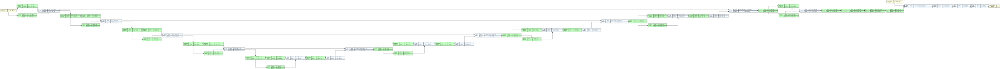

In [ ]:
model_viz = ResUNetSeparator(
  n_classes=5,
  n_mels=128,
  n_fft=2048,
  hop_length=512
)

# Create Dummy Inputs (Batch Size = 1)
B, C, F, T = 1, 1, 128, 100
n_freqs = 2048 // 2 + 1
mel_dummy = torch.randn(B, 1, 128, T)
stft_dummy = torch.randn(B, 1, n_freqs, T, dtype=torch.cfloat)

graph = draw_graph(
  model_viz,
  input_data=(mel_dummy, stft_dummy),
  expand_nested=False,
  depth=2,
  save_graph=False,
)

graph.visual_graph.attr(
  rankdir='LR',
  nodesep='1',
  ranksep='0.1',
  splines='ortho',
  concentrate='true'
)

# Display
graph.visual_graph.render('ResUNet Architecture', format='png')
graph.visual_graph

In [ ]:
summary(
  model_viz,
  input_data=[mel_dummy, stft_dummy],
  col_names=["input_size", "output_size", "num_params", "kernel_size"],
  depth=3
)

Layer (type:depth-idx)                   Input Shape               Output Shape              Param #                   Kernel Shape
ResUNetSeparator                         [1, 1, 128, 100]          [1, 5, 50688]             --                        --
├─RCM: 1-1                               [1, 1, 128, 100]          [1, 16, 128, 100]         --                        --
│    └─Sequential: 2-1                   [1, 1, 128, 100]          [1, 16, 128, 100]         --                        --
│    │    └─BatchNorm2d: 3-1             [1, 1, 128, 100]          [1, 1, 128, 100]          2                         --
│    │    └─GELU: 3-2                    [1, 1, 128, 100]          [1, 1, 128, 100]          --                        --
│    │    └─Conv2d: 3-3                  [1, 1, 128, 100]          [1, 16, 128, 100]         144                       [3, 3]
│    │    └─BatchNorm2d: 3-4             [1, 16, 128, 100]         [1, 16, 128, 100]         32                        --
│    │    

### Hybrid Separator (CNN + Transformer)

The Transformer use TSA (Temporal Sequence Attention) + FSA (Frequency Sequence Attention).

#### Model Class

In [ ]:
class TSA_FSA_Block(nn.Module):
  def __init__(self, channels, n_freqs, n_time, n_heads=4, mlp_ratio=2.0):
    super().__init__()

    self.tsa_layer = nn.TransformerEncoderLayer(
      d_model=channels,
      nhead=n_heads,
      dim_feedforward=int(channels * mlp_ratio),
      dropout=0.1,
      activation='gelu',
      batch_first=True
    )

    self.fsa_layer = nn.TransformerEncoderLayer(
      d_model=channels,
      nhead=n_heads,
      dim_feedforward=int(channels * mlp_ratio),
      dropout=0.1,
      activation='gelu',
      batch_first=True
    )

  def forward(self, x):
    b, c, f, t = x.shape

    # Reshape: [B, C, F, T] -> [B, F, T, C] -> [B*F, T, C]
    x_tsa = x.permute(0, 2, 3, 1).reshape(b * f, t, c)

    x_tsa = self.tsa_layer(x_tsa)

    # Reshape back: [B*F, T, C] -> [B, F, T, C] -> [B, C, F, T]
    x = x_tsa.reshape(b, f, t, c).permute(0, 3, 1, 2)

    # Reshape: [B, C, F, T] -> [B, T, F, C] -> [B*T, F, C]
    x_fsa = x.permute(0, 3, 2, 1).reshape(b * t, f, c)

    x_fsa = self.fsa_layer(x_fsa)

    # Reshape back: [B*T, F, C] -> [B, T, F, C] -> [B, C, F, T]
    x = x_fsa.reshape(b, t, f, c).permute(0, 3, 2, 1)

    return x

In [ ]:
class HybridSeparator(ResUNetSeparator):
  def __init__(self, n_classes, n_mels=128, n_fft=2048, hop_length=512, n_time_frames=626):
    super().__init__(n_classes, n_mels, n_fft, hop_length)

    # Calculate bottleneck dimensions
    bn_freq = n_mels // 16
    bn_time = n_time_frames // 16

    self.bottleneck_proj = nn.Conv2d(128, 256, kernel_size=1)

    self.bottleneck = nn.Sequential(
      TSA_FSA_Block(channels=256, n_freqs=bn_freq, n_time=bn_time, n_heads=4),
      TSA_FSA_Block(channels=256, n_freqs=bn_freq, n_time=bn_time, n_heads=4)
    )

  def forward(self, mel_mixture, stft_mixture):
    b_in, skips = self.run_encoder(mel_mixture)

    b_proj = self.bottleneck_proj(b_in)
    b_out = self.bottleneck(b_proj)

    return self.run_decoder(b_out, skips, stft_mixture)

#### Visualize architecture

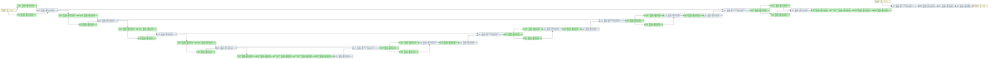

In [ ]:
model_viz = HybridSeparator(
  n_classes=5,
  n_mels=128,
  n_fft=2048,
  hop_length=512
)

# Create Dummy Inputs (Batch Size = 1)
B, C, F, T = 1, 1, 128, 100
n_freqs = 2048 // 2 + 1
mel_dummy = torch.randn(B, 1, 128, T)
stft_dummy = torch.randn(B, 1, n_freqs, T, dtype=torch.cfloat)

graph = draw_graph(
  model_viz,
  input_data=(mel_dummy, stft_dummy),
  expand_nested=False,
  depth=2,
  save_graph=False,
)

graph.visual_graph.attr(
  rankdir='LR',
  nodesep='1',
  ranksep='0.1',
  splines='ortho',
  concentrate='true'
)

# Display
graph.visual_graph.render('Hybrid Architecture', format='png')
graph.visual_graph

In [ ]:
summary(
  model_viz,
  input_data=[mel_dummy, stft_dummy],
  col_names=["input_size", "output_size", "num_params", "kernel_size"],
  depth=3
)

Layer (type:depth-idx)                        Input Shape               Output Shape              Param #                   Kernel Shape
HybridSeparator                               [1, 1, 128, 100]          [1, 5, 50688]             --                        --
├─RCM: 1-1                                    [1, 1, 128, 100]          [1, 16, 128, 100]         --                        --
│    └─Sequential: 2-1                        [1, 1, 128, 100]          [1, 16, 128, 100]         --                        --
│    │    └─BatchNorm2d: 3-1                  [1, 1, 128, 100]          [1, 1, 128, 100]          2                         --
│    │    └─GELU: 3-2                         [1, 1, 128, 100]          [1, 1, 128, 100]          --                        --
│    │    └─Conv2d: 3-3                       [1, 1, 128, 100]          [1, 16, 128, 100]         144                       [3, 3]
│    │    └─BatchNorm2d: 3-4                  [1, 16, 128, 100]         [1, 16, 128, 100]        

## Training

In [ ]:
# Copy to the local runtime for faster load data
!cp -r  '/content/drive/MyDrive/PSD_Project/Datasets/Processed' '/content/dataset'

In [ ]:
# Clean up cache after each train
import gc
torch.cuda.empty_cache()
gc.collect()

46

### Training Functions

In [ ]:
# Training Dataset
train_dataset = SoundEventDataset(
  metadata_path='metadata/train_metadata.jsonl',
  base_dir='/content/dataset',
  class_list=SELECTED_CLASSES,
  sr=SR,
  duration=DURATION
)
train_loader = DataLoader(
  train_dataset,
  batch_size=BATCH_SIZE,
  shuffle=True,
  num_workers=2,
  pin_memory=True
)

# Validation Dataset
valid_dataset = SoundEventDataset(
  metadata_path='metadata/valid_metadata.jsonl',
  base_dir='/content/dataset',
  class_list=SELECTED_CLASSES,
  sr=SR,
  duration=DURATION
)
valid_loader = DataLoader(
  valid_dataset,
  batch_size=BATCH_SIZE,
  shuffle=False,
  num_workers=2,
  pin_memory=True
)

In [ ]:
def training_model(
    model, train_loader, valid_loader,
    device, lr, best_model_path, epochs,
    patience_rlr, factor, patience_early,
    sr, resume_training, use_spec_augment
    ):
  best_model_path = os.path.join(best_model_path, 'best.pth')
  torch_device = torch.device(device)

  if resume_training and os.path.exists(best_model_path):
    tqdm.write(f"Loading best model from {best_model_path}")
    model.load_state_dict(torch.load(best_model_path))

  model = model.to(torch_device)

  optimizer = torch.optim.AdamW(model.parameters(), lr=lr, weight_decay=1e-4)
  criterion = SilenceAwareSISNRLoss().to(torch_device)
  scaler = torch.amp.GradScaler(device) # type: ignore

  scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer, mode='min', factor=factor, patience=patience_rlr
  )

  preprocessor = AudioPreprocessor(sr, model.n_fft, model.hop_length, model.n_mels).to(torch_device)

  best_val_loss = float('inf')
  patience_counter = 0
  train_history = []
  val_history = []

  tqdm.write("Starting Training...\n")

  for epoch in range(epochs):
    model.train()
    train_loss = 0.0

    train_loop = tqdm(train_loader, leave=True, colour='#32CD32')
    train_loop.set_description(f"Epoch {epoch+1}/{epochs} [Train]")

    for mixture_wav, target_wav in train_loop:
      # Data Integrity Checks
      if torch.isnan(mixture_wav).any() or torch.isinf(mixture_wav).any():
        continue

      mixture_wav = mixture_wav.to(torch_device)
      target_wav = target_wav.to(torch_device)

      optimizer.zero_grad()

      # Forward Pass
      with torch.amp.autocast(device): # type: ignore
        with torch.no_grad():
          mix_mel, mix_stft_complex = preprocessor(mixture_wav, augment=use_spec_augment)
        waveform_separated = model(mix_mel, mix_stft_complex)

      # Loss Calculation
      loss = criterion(waveform_separated, target_wav)

      if torch.isnan(loss) or torch.isinf(loss):
        tqdm.write(f"!!! NaN/Inf DETECTED in Loss - Skipping Batch !!!")
        continue

      # Backward Pass
      scaler.scale(loss).backward()
      scaler.unscale_(optimizer)
      torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
      scaler.step(optimizer)
      scaler.update()

      train_loss += loss.item()
      train_loop.set_postfix(loss=f"{loss.item():.4f}")

    avg_train_loss = train_loss / len(train_loader) if len(train_loader) > 0 else 0
    train_history.append(avg_train_loss)

    # VALIDATION LOOP
    model.eval()
    val_loss = 0.0

    val_loop = tqdm(valid_loader, leave=True, colour='#FFA500')
    val_loop.set_description(f"Epoch {epoch+1}/{epochs} [Valid]")

    with torch.no_grad():
      for mixture_wav, target_wav in val_loop:
        mixture_wav = mixture_wav.to(torch_device)
        target_wav = target_wav.to(torch_device)

        with torch.amp.autocast(device):  # type: ignore
          mix_mel, mix_stft_complex = preprocessor(mixture_wav, augment=False)
          waveform_separated = model(mix_mel, mix_stft_complex)

        loss = criterion(waveform_separated, target_wav)

        val_loss += loss.item()
        val_loop.set_postfix(loss=f"{loss.item():.4f}")

    avg_val_loss = val_loss / len(valid_loader) if len(valid_loader) > 0 else 0
    val_history.append(avg_val_loss)

    current_lr = optimizer.param_groups[0]['lr']

    tqdm.write("-" * 40)
    tqdm.write(f"EPOCH {epoch+1} SUMMARY:")
    tqdm.write(f"  • Train Loss: {avg_train_loss:.5f}")
    tqdm.write(f"  • Val Loss:   {avg_val_loss:.5f}")
    tqdm.write(f"  • LR:         {current_lr:.2e}")

    scheduler.step(avg_val_loss)

    if avg_val_loss < best_val_loss:
      diff = best_val_loss - avg_val_loss
      best_val_loss = avg_val_loss
      torch.save(model.state_dict(), best_model_path)

      tqdm.write(f"  ★ SAVED BEST MODEL (Improved by {diff:.4f})")
      patience_counter = 0
    else:
      patience_counter += 1
      tqdm.write(f"  [!] No improvement. Patience: {patience_counter}/{patience_early}")

    tqdm.write("-" * 40 + "\n")

    if patience_counter >= patience_early:
      tqdm.write(f"\n!!! Early Stopping triggered! Validation loss hasn't improved for {patience_early} epochs.")
      tqdm.write(f"Restoring best model...")
      break

  tqdm.write("\nTraining Complete.")
  if os.path.exists(best_model_path):
    model.load_state_dict(torch.load(best_model_path))

  return model, train_history, val_history

### Baseline (CNN, No Augment)

In [ ]:
path_baseline_dir = os.path.join(MODEL_ROOT, 'baseline')
os.makedirs(path_baseline_dir, exist_ok=True)

In [ ]:
model_baseline = ResUNetSeparator(
  n_classes=len(SELECTED_CLASSES),
  n_mels=N_MELS,
  n_fft=N_FFT,
  hop_length=HOP_LENGTH
)

model_baseline, train_history, val_history = training_model(
  model=model_baseline,
  train_loader=train_loader,
  valid_loader=valid_loader,
  device=DEVICE,
  lr=LEARNING_RATE,
  best_model_path=path_baseline_dir,
  epochs=EPOCHS,
  patience_early=PATIENCE_EARLY_STOP,
  factor=FACTOR_OPTIMIZER,
  patience_rlr=PATIENCE_LR_REDUCE,
  sr=SR,
  resume_training=False,
  use_spec_augment=False
)

df_loss_baseline = pd.DataFrame({
  'epoch': range(1, len(train_history) + 1),
  'train_loss': train_history,
  'val_loss': val_history
})

df_loss_baseline.to_csv(os.path.join(path_baseline_dir, 'loss.csv'), index=False)

df_long = pd.melt(
  df_loss_baseline, id_vars=['epoch'],
  value_vars=['train_loss', 'val_loss'],
  value_name='loss'
)
fig = px.line(
  df_long, x='epoch',
  y='loss',
  color='variable',
  title='Training and Validation Loss (Baseline)'
)
fig.show()

Starting Training...



Epoch 1/50 [Valid]: 100%|██████████| 47/47 [00:35<00:00,  1.31it/s, loss=-1.6768]


----------------------------------------
EPOCH 1 SUMMARY:
  • Train Loss: -3.93196
  • Val Loss:   -1.08171
  • LR:         1.00e-04
  ★ SAVED BEST MODEL (Improved by inf)
----------------------------------------



Epoch 2/50 [Valid]: 100%|██████████| 47/47 [00:35<00:00,  1.33it/s, loss=-2.4448]


----------------------------------------
EPOCH 2 SUMMARY:
  • Train Loss: -7.38314
  • Val Loss:   -1.78217
  • LR:         1.00e-04
  ★ SAVED BEST MODEL (Improved by 0.7005)
----------------------------------------



Epoch 3/50 [Valid]: 100%|██████████| 47/47 [00:36<00:00,  1.27it/s, loss=-3.2078]


----------------------------------------
EPOCH 3 SUMMARY:
  • Train Loss: -8.62741
  • Val Loss:   -2.33237
  • LR:         1.00e-04
  ★ SAVED BEST MODEL (Improved by 0.5502)
----------------------------------------



Epoch 4/50 [Valid]: 100%|██████████| 47/47 [00:36<00:00,  1.29it/s, loss=-1.7175]


----------------------------------------
EPOCH 4 SUMMARY:
  • Train Loss: -9.57852
  • Val Loss:   -1.43517
  • LR:         1.00e-04
  [!] No improvement. Patience: 1/15
----------------------------------------



Epoch 5/50 [Valid]: 100%|██████████| 47/47 [00:36<00:00,  1.28it/s, loss=-1.8450]


----------------------------------------
EPOCH 5 SUMMARY:
  • Train Loss: -10.30053
  • Val Loss:   -1.50850
  • LR:         1.00e-04
  [!] No improvement. Patience: 2/15
----------------------------------------



Epoch 6/50 [Valid]: 100%|██████████| 47/47 [00:36<00:00,  1.28it/s, loss=-1.3044]


----------------------------------------
EPOCH 6 SUMMARY:
  • Train Loss: -10.74667
  • Val Loss:   -1.08518
  • LR:         9.00e-05
  [!] No improvement. Patience: 3/15
----------------------------------------



Epoch 7/50 [Valid]: 100%|██████████| 47/47 [00:35<00:00,  1.32it/s, loss=-2.6369]


----------------------------------------
EPOCH 7 SUMMARY:
  • Train Loss: -11.08920
  • Val Loss:   -1.92480
  • LR:         9.00e-05
  [!] No improvement. Patience: 4/15
----------------------------------------



Epoch 8/50 [Valid]: 100%|██████████| 47/47 [00:35<00:00,  1.31it/s, loss=-2.1598]


----------------------------------------
EPOCH 8 SUMMARY:
  • Train Loss: -11.34992
  • Val Loss:   -1.58220
  • LR:         8.10e-05
  [!] No improvement. Patience: 5/15
----------------------------------------



Epoch 9/50 [Valid]: 100%|██████████| 47/47 [00:36<00:00,  1.28it/s, loss=-1.3971]


----------------------------------------
EPOCH 9 SUMMARY:
  • Train Loss: -11.54974
  • Val Loss:   -1.04912
  • LR:         8.10e-05
  [!] No improvement. Patience: 6/15
----------------------------------------



Epoch 10/50 [Valid]: 100%|██████████| 47/47 [00:36<00:00,  1.29it/s, loss=-0.6874]


----------------------------------------
EPOCH 10 SUMMARY:
  • Train Loss: -11.71548
  • Val Loss:   -0.41297
  • LR:         7.29e-05
  [!] No improvement. Patience: 7/15
----------------------------------------



Epoch 11/50 [Valid]: 100%|██████████| 47/47 [00:36<00:00,  1.29it/s, loss=-2.2379]


----------------------------------------
EPOCH 11 SUMMARY:
  • Train Loss: -11.85563
  • Val Loss:   -1.49015
  • LR:         7.29e-05
  [!] No improvement. Patience: 8/15
----------------------------------------



Epoch 12/50 [Valid]: 100%|██████████| 47/47 [00:36<00:00,  1.28it/s, loss=-1.9986]


----------------------------------------
EPOCH 12 SUMMARY:
  • Train Loss: -12.00375
  • Val Loss:   -1.35039
  • LR:         6.56e-05
  [!] No improvement. Patience: 9/15
----------------------------------------



Epoch 13/50 [Valid]: 100%|██████████| 47/47 [00:36<00:00,  1.30it/s, loss=-2.2398]


----------------------------------------
EPOCH 13 SUMMARY:
  • Train Loss: -12.13497
  • Val Loss:   -1.19101
  • LR:         6.56e-05
  [!] No improvement. Patience: 10/15
----------------------------------------



Epoch 14/50 [Valid]: 100%|██████████| 47/47 [00:36<00:00,  1.28it/s, loss=-1.9467]


----------------------------------------
EPOCH 14 SUMMARY:
  • Train Loss: -12.25428
  • Val Loss:   -1.17427
  • LR:         5.90e-05
  [!] No improvement. Patience: 11/15
----------------------------------------



Epoch 15/50 [Valid]: 100%|██████████| 47/47 [00:36<00:00,  1.28it/s, loss=-1.2594]


----------------------------------------
EPOCH 15 SUMMARY:
  • Train Loss: -12.34486
  • Val Loss:   -1.04977
  • LR:         5.90e-05
  [!] No improvement. Patience: 12/15
----------------------------------------



Epoch 16/50 [Valid]: 100%|██████████| 47/47 [00:36<00:00,  1.27it/s, loss=-2.3288]


----------------------------------------
EPOCH 16 SUMMARY:
  • Train Loss: -12.45640
  • Val Loss:   -1.16259
  • LR:         5.31e-05
  [!] No improvement. Patience: 13/15
----------------------------------------



Epoch 17/50 [Valid]: 100%|██████████| 47/47 [00:36<00:00,  1.28it/s, loss=-2.1450]


----------------------------------------
EPOCH 17 SUMMARY:
  • Train Loss: -12.53976
  • Val Loss:   -1.12616
  • LR:         5.31e-05
  [!] No improvement. Patience: 14/15
----------------------------------------



Epoch 18/50 [Valid]: 100%|██████████| 47/47 [00:36<00:00,  1.28it/s, loss=-1.1865]


----------------------------------------
EPOCH 18 SUMMARY:
  • Train Loss: -12.63548
  • Val Loss:   -0.53837
  • LR:         4.78e-05
  [!] No improvement. Patience: 15/15
----------------------------------------


!!! Early Stopping triggered! Validation loss hasn't improved for 15 epochs.
Restoring best model...

Training Complete.


### CNN + Augment

In [ ]:
path_CNN_augment_dir = os.path.join(MODEL_ROOT, 'cnn_augment')
os.makedirs(path_CNN_augment_dir, exist_ok=True)

In [ ]:
model_CNN_augment = ResUNetSeparator(
  n_classes=len(SELECTED_CLASSES),
  n_mels=N_MELS,
  n_fft=N_FFT,
  hop_length=HOP_LENGTH
)

model_CNN_augment, train_history, val_history = training_model(
  model=model_CNN_augment,
  train_loader=train_loader,
  valid_loader=valid_loader,
  device=DEVICE,
  lr=LEARNING_RATE,
  best_model_path=path_CNN_augment_dir,
  epochs=EPOCHS,
  patience_early=PATIENCE_EARLY_STOP,
  factor=FACTOR_OPTIMIZER,
  patience_rlr=PATIENCE_LR_REDUCE,
  sr=SR,
  resume_training=False,
  use_spec_augment=True
)

df_loss_CNN_augment = pd.DataFrame({
  'epoch': range(1, len(train_history) + 1),
  'train_loss': train_history,
  'val_loss': val_history
})

df_loss_CNN_augment.to_csv(os.path.join(path_CNN_augment_dir, 'loss.csv'), index=False)

df_long = pd.melt(
  df_loss_CNN_augment, id_vars=['epoch'],
  value_vars=['train_loss', 'val_loss'],
  value_name='loss'
)
fig = px.line(
  df_long, x='epoch',
  y='loss',
  color='variable',
  title='Training and Validation Loss (CNN + Augment)'
)
fig.show()

Starting Training...



Epoch 1/50 [Valid]: 100%|██████████| 47/47 [00:35<00:00,  1.31it/s, loss=-2.2886]


----------------------------------------
EPOCH 1 SUMMARY:
  • Train Loss: -3.49733
  • Val Loss:   -1.54427
  • LR:         1.00e-04
  ★ SAVED BEST MODEL (Improved by inf)
----------------------------------------



Epoch 2/50 [Valid]: 100%|██████████| 47/47 [00:36<00:00,  1.30it/s, loss=-3.1558]


----------------------------------------
EPOCH 2 SUMMARY:
  • Train Loss: -6.52157
  • Val Loss:   -2.50510
  • LR:         1.00e-04
  ★ SAVED BEST MODEL (Improved by 0.9608)
----------------------------------------



Epoch 3/50 [Valid]: 100%|██████████| 47/47 [00:36<00:00,  1.29it/s, loss=-4.0201]


----------------------------------------
EPOCH 3 SUMMARY:
  • Train Loss: -7.83748
  • Val Loss:   -3.13875
  • LR:         1.00e-04
  ★ SAVED BEST MODEL (Improved by 0.6336)
----------------------------------------



Epoch 4/50 [Valid]: 100%|██████████| 47/47 [00:35<00:00,  1.32it/s, loss=-4.2078]


----------------------------------------
EPOCH 4 SUMMARY:
  • Train Loss: -8.62746
  • Val Loss:   -2.94855
  • LR:         1.00e-04
  [!] No improvement. Patience: 1/15
----------------------------------------



Epoch 5/50 [Valid]: 100%|██████████| 47/47 [00:36<00:00,  1.29it/s, loss=-3.9852]


----------------------------------------
EPOCH 5 SUMMARY:
  • Train Loss: -9.37217
  • Val Loss:   -2.62203
  • LR:         1.00e-04
  [!] No improvement. Patience: 2/15
----------------------------------------



Epoch 6/50 [Valid]: 100%|██████████| 47/47 [00:36<00:00,  1.29it/s, loss=-2.2287]


----------------------------------------
EPOCH 6 SUMMARY:
  • Train Loss: -10.01111
  • Val Loss:   -1.35261
  • LR:         9.00e-05
  [!] No improvement. Patience: 3/15
----------------------------------------



Epoch 7/50 [Valid]: 100%|██████████| 47/47 [00:36<00:00,  1.29it/s, loss=-1.6408]


----------------------------------------
EPOCH 7 SUMMARY:
  • Train Loss: -10.75720
  • Val Loss:   -0.68262
  • LR:         9.00e-05
  [!] No improvement. Patience: 4/15
----------------------------------------



Epoch 8/50 [Valid]: 100%|██████████| 47/47 [00:36<00:00,  1.29it/s, loss=-2.1267]


----------------------------------------
EPOCH 8 SUMMARY:
  • Train Loss: -11.05539
  • Val Loss:   -1.29822
  • LR:         8.10e-05
  [!] No improvement. Patience: 5/15
----------------------------------------



Epoch 9/50 [Valid]: 100%|██████████| 47/47 [00:36<00:00,  1.29it/s, loss=-1.9815]


----------------------------------------
EPOCH 9 SUMMARY:
  • Train Loss: -11.22050
  • Val Loss:   -1.30976
  • LR:         8.10e-05
  [!] No improvement. Patience: 6/15
----------------------------------------



Epoch 10/50 [Valid]: 100%|██████████| 47/47 [00:36<00:00,  1.29it/s, loss=-1.3928]


----------------------------------------
EPOCH 10 SUMMARY:
  • Train Loss: -11.40139
  • Val Loss:   -0.93714
  • LR:         7.29e-05
  [!] No improvement. Patience: 7/15
----------------------------------------



Epoch 11/50 [Valid]: 100%|██████████| 47/47 [00:36<00:00,  1.29it/s, loss=-1.1150]


----------------------------------------
EPOCH 11 SUMMARY:
  • Train Loss: -11.48212
  • Val Loss:   -0.78382
  • LR:         7.29e-05
  [!] No improvement. Patience: 8/15
----------------------------------------



Epoch 12/50 [Valid]: 100%|██████████| 47/47 [00:36<00:00,  1.29it/s, loss=-1.3969]


----------------------------------------
EPOCH 12 SUMMARY:
  • Train Loss: -11.60218
  • Val Loss:   -0.95351
  • LR:         6.56e-05
  [!] No improvement. Patience: 9/15
----------------------------------------



Epoch 13/50 [Valid]: 100%|██████████| 47/47 [00:36<00:00,  1.30it/s, loss=-1.3012]


----------------------------------------
EPOCH 13 SUMMARY:
  • Train Loss: -11.69570
  • Val Loss:   -0.81772
  • LR:         6.56e-05
  [!] No improvement. Patience: 10/15
----------------------------------------



Epoch 14/50 [Valid]: 100%|██████████| 47/47 [00:36<00:00,  1.28it/s, loss=-0.5284]


----------------------------------------
EPOCH 14 SUMMARY:
  • Train Loss: -11.81968
  • Val Loss:   -0.25473
  • LR:         5.90e-05
  [!] No improvement. Patience: 11/15
----------------------------------------



Epoch 15/50 [Valid]: 100%|██████████| 47/47 [00:36<00:00,  1.30it/s, loss=-0.1664]


----------------------------------------
EPOCH 15 SUMMARY:
  • Train Loss: -11.93514
  • Val Loss:   -0.23853
  • LR:         5.90e-05
  [!] No improvement. Patience: 12/15
----------------------------------------



Epoch 16/50 [Valid]: 100%|██████████| 47/47 [00:36<00:00,  1.29it/s, loss=-1.1278]


----------------------------------------
EPOCH 16 SUMMARY:
  • Train Loss: -12.00989
  • Val Loss:   -0.92056
  • LR:         5.31e-05
  [!] No improvement. Patience: 13/15
----------------------------------------



Epoch 17/50 [Valid]: 100%|██████████| 47/47 [00:36<00:00,  1.29it/s, loss=-1.2001]


----------------------------------------
EPOCH 17 SUMMARY:
  • Train Loss: -12.09504
  • Val Loss:   -0.68880
  • LR:         5.31e-05
  [!] No improvement. Patience: 14/15
----------------------------------------



Epoch 18/50 [Valid]: 100%|██████████| 47/47 [00:35<00:00,  1.31it/s, loss=-0.7196]

----------------------------------------
EPOCH 18 SUMMARY:
  • Train Loss: -12.21281
  • Val Loss:   -0.45236
  • LR:         4.78e-05
  [!] No improvement. Patience: 15/15
----------------------------------------


!!! Early Stopping triggered! Validation loss hasn't improved for 15 epochs.
Restoring best model...

Training Complete.


### Hybrid (No Augment)

In [ ]:
path_hybrid_dir = os.path.join(MODEL_ROOT, 'hybrid')
os.makedirs(path_hybrid_dir, exist_ok=True)

In [ ]:
model_hybrid = HybridSeparator(
  n_classes=len(SELECTED_CLASSES),
  n_mels=N_MELS,
  n_fft=N_FFT,
  hop_length=HOP_LENGTH,
  n_time_frames=626
)

model_hybrid, train_history, val_history = training_model(
  model=model_hybrid,
  train_loader=train_loader,
  valid_loader=valid_loader,
  device=DEVICE,
  lr=LEARNING_RATE,
  best_model_path=path_hybrid_dir,
  epochs=EPOCHS,
  patience_early=PATIENCE_EARLY_STOP,
  factor=FACTOR_OPTIMIZER,
  patience_rlr=PATIENCE_LR_REDUCE,
  sr=SR,
  resume_training=False,
  use_spec_augment=False
)

df_loss_hybrid = pd.DataFrame({
  'epoch': range(1, len(train_history) + 1),
  'train_loss': train_history,
  'val_loss': val_history
})

df_loss_hybrid.to_csv(os.path.join(path_hybrid_dir, 'loss.csv'), index=False)

df_long = pd.melt(
  df_loss_hybrid, id_vars=['epoch'],
  value_vars=['train_loss', 'val_loss'],
  value_name='loss'
)
fig = px.line(
  df_long, x='epoch',
  y='loss',
  color='variable',
  title='Training and Validation Loss (Hybrid Without Augment)'
)
fig.show()

Starting Training...



Epoch 1/50 [Valid]: 100%|██████████| 47/47 [00:36<00:00,  1.28it/s, loss=-0.4752]


----------------------------------------
EPOCH 1 SUMMARY:
  • Train Loss: -4.39864
  • Val Loss:   -0.00317
  • LR:         1.00e-04
  ★ SAVED BEST MODEL (Improved by inf)
----------------------------------------



Epoch 2/50 [Valid]: 100%|██████████| 47/47 [00:35<00:00,  1.32it/s, loss=-1.2154]


----------------------------------------
EPOCH 2 SUMMARY:
  • Train Loss: -8.64000
  • Val Loss:   -0.66855
  • LR:         1.00e-04
  ★ SAVED BEST MODEL (Improved by 0.6654)
----------------------------------------



Epoch 3/50 [Valid]: 100%|██████████| 47/47 [00:36<00:00,  1.29it/s, loss=-1.1721]


----------------------------------------
EPOCH 3 SUMMARY:
  • Train Loss: -10.38434
  • Val Loss:   -1.03360
  • LR:         1.00e-04
  ★ SAVED BEST MODEL (Improved by 0.3651)
----------------------------------------



Epoch 4/50 [Valid]: 100%|██████████| 47/47 [00:37<00:00,  1.26it/s, loss=-2.4405]


----------------------------------------
EPOCH 4 SUMMARY:
  • Train Loss: -11.13856
  • Val Loss:   -1.96815
  • LR:         1.00e-04
  ★ SAVED BEST MODEL (Improved by 0.9345)
----------------------------------------



Epoch 5/50 [Valid]: 100%|██████████| 47/47 [00:36<00:00,  1.28it/s, loss=-3.3510]


----------------------------------------
EPOCH 5 SUMMARY:
  • Train Loss: -11.85071
  • Val Loss:   -2.48268
  • LR:         1.00e-04
  ★ SAVED BEST MODEL (Improved by 0.5145)
----------------------------------------



Epoch 6/50 [Valid]: 100%|██████████| 47/47 [00:35<00:00,  1.32it/s, loss=-3.2129]


----------------------------------------
EPOCH 6 SUMMARY:
  • Train Loss: -12.48791
  • Val Loss:   -2.39070
  • LR:         1.00e-04
  [!] No improvement. Patience: 1/15
----------------------------------------



Epoch 7/50 [Valid]: 100%|██████████| 47/47 [00:36<00:00,  1.29it/s, loss=-3.5399]


----------------------------------------
EPOCH 7 SUMMARY:
  • Train Loss: -12.80389
  • Val Loss:   -2.94966
  • LR:         1.00e-04
  ★ SAVED BEST MODEL (Improved by 0.4670)
----------------------------------------



Epoch 8/50 [Valid]: 100%|██████████| 47/47 [00:36<00:00,  1.29it/s, loss=-4.9312]


----------------------------------------
EPOCH 8 SUMMARY:
  • Train Loss: -13.09942
  • Val Loss:   -3.59457
  • LR:         1.00e-04
  ★ SAVED BEST MODEL (Improved by 0.6449)
----------------------------------------



Epoch 9/50 [Valid]: 100%|██████████| 47/47 [00:36<00:00,  1.29it/s, loss=-4.7176]


----------------------------------------
EPOCH 9 SUMMARY:
  • Train Loss: -13.23639
  • Val Loss:   -3.66243
  • LR:         1.00e-04
  ★ SAVED BEST MODEL (Improved by 0.0679)
----------------------------------------



Epoch 10/50 [Valid]: 100%|██████████| 47/47 [00:35<00:00,  1.31it/s, loss=-4.6917]


----------------------------------------
EPOCH 10 SUMMARY:
  • Train Loss: -13.37042
  • Val Loss:   -3.35691
  • LR:         1.00e-04
  [!] No improvement. Patience: 1/15
----------------------------------------



Epoch 11/50 [Valid]: 100%|██████████| 47/47 [00:37<00:00,  1.27it/s, loss=-5.3324]


----------------------------------------
EPOCH 11 SUMMARY:
  • Train Loss: -13.47260
  • Val Loss:   -4.20202
  • LR:         1.00e-04
  ★ SAVED BEST MODEL (Improved by 0.5396)
----------------------------------------



Epoch 12/50 [Valid]: 100%|██████████| 47/47 [00:36<00:00,  1.27it/s, loss=-4.2872]


----------------------------------------
EPOCH 12 SUMMARY:
  • Train Loss: -13.53904
  • Val Loss:   -3.44776
  • LR:         1.00e-04
  [!] No improvement. Patience: 1/15
----------------------------------------



Epoch 13/50 [Valid]: 100%|██████████| 47/47 [00:36<00:00,  1.28it/s, loss=-4.9816]


----------------------------------------
EPOCH 13 SUMMARY:
  • Train Loss: -13.61574
  • Val Loss:   -3.81933
  • LR:         1.00e-04
  [!] No improvement. Patience: 2/15
----------------------------------------



Epoch 14/50 [Valid]: 100%|██████████| 47/47 [00:35<00:00,  1.31it/s, loss=-4.9182]


----------------------------------------
EPOCH 14 SUMMARY:
  • Train Loss: -13.80247
  • Val Loss:   -3.81565
  • LR:         9.00e-05
  [!] No improvement. Patience: 3/15
----------------------------------------



Epoch 15/50 [Valid]: 100%|██████████| 47/47 [00:36<00:00,  1.30it/s, loss=-5.1881]


----------------------------------------
EPOCH 15 SUMMARY:
  • Train Loss: -13.90217
  • Val Loss:   -4.20213
  • LR:         9.00e-05
  ★ SAVED BEST MODEL (Improved by 0.0001)
----------------------------------------



Epoch 16/50 [Valid]: 100%|██████████| 47/47 [00:37<00:00,  1.26it/s, loss=-5.2496]


----------------------------------------
EPOCH 16 SUMMARY:
  • Train Loss: -13.91735
  • Val Loss:   -4.04530
  • LR:         9.00e-05
  [!] No improvement. Patience: 1/15
----------------------------------------



Epoch 17/50 [Valid]: 100%|██████████| 47/47 [00:36<00:00,  1.27it/s, loss=-5.6520]


----------------------------------------
EPOCH 17 SUMMARY:
  • Train Loss: -13.96350
  • Val Loss:   -4.26003
  • LR:         9.00e-05
  ★ SAVED BEST MODEL (Improved by 0.0579)
----------------------------------------



Epoch 18/50 [Valid]: 100%|██████████| 47/47 [00:37<00:00,  1.27it/s, loss=-4.6933]


----------------------------------------
EPOCH 18 SUMMARY:
  • Train Loss: -14.01678
  • Val Loss:   -3.86301
  • LR:         9.00e-05
  [!] No improvement. Patience: 1/15
----------------------------------------



Epoch 19/50 [Valid]: 100%|██████████| 47/47 [00:36<00:00,  1.28it/s, loss=-5.0304]


----------------------------------------
EPOCH 19 SUMMARY:
  • Train Loss: -14.03186
  • Val Loss:   -3.68819
  • LR:         9.00e-05
  [!] No improvement. Patience: 2/15
----------------------------------------



Epoch 20/50 [Valid]: 100%|██████████| 47/47 [00:36<00:00,  1.30it/s, loss=-5.3040]


----------------------------------------
EPOCH 20 SUMMARY:
  • Train Loss: -14.08166
  • Val Loss:   -3.98621
  • LR:         8.10e-05
  [!] No improvement. Patience: 3/15
----------------------------------------



Epoch 21/50 [Valid]: 100%|██████████| 47/47 [00:36<00:00,  1.28it/s, loss=-3.8770]


----------------------------------------
EPOCH 21 SUMMARY:
  • Train Loss: -14.10563
  • Val Loss:   -3.09030
  • LR:         8.10e-05
  [!] No improvement. Patience: 4/15
----------------------------------------



Epoch 22/50 [Valid]: 100%|██████████| 47/47 [00:36<00:00,  1.28it/s, loss=-4.7993]


----------------------------------------
EPOCH 22 SUMMARY:
  • Train Loss: -14.17899
  • Val Loss:   -3.60873
  • LR:         7.29e-05
  [!] No improvement. Patience: 5/15
----------------------------------------



Epoch 23/50 [Valid]: 100%|██████████| 47/47 [00:36<00:00,  1.27it/s, loss=-5.5871]


----------------------------------------
EPOCH 23 SUMMARY:
  • Train Loss: -14.19104
  • Val Loss:   -3.97810
  • LR:         7.29e-05
  [!] No improvement. Patience: 6/15
----------------------------------------



Epoch 24/50 [Valid]: 100%|██████████| 47/47 [00:37<00:00,  1.27it/s, loss=-5.3340]


----------------------------------------
EPOCH 24 SUMMARY:
  • Train Loss: -14.22233
  • Val Loss:   -3.69667
  • LR:         6.56e-05
  [!] No improvement. Patience: 7/15
----------------------------------------



Epoch 25/50 [Valid]: 100%|██████████| 47/47 [00:37<00:00,  1.26it/s, loss=-5.0339]


----------------------------------------
EPOCH 25 SUMMARY:
  • Train Loss: -14.24317
  • Val Loss:   -3.50532
  • LR:         6.56e-05
  [!] No improvement. Patience: 8/15
----------------------------------------



Epoch 26/50 [Valid]: 100%|██████████| 47/47 [00:35<00:00,  1.31it/s, loss=-4.8889]


----------------------------------------
EPOCH 26 SUMMARY:
  • Train Loss: -14.25703
  • Val Loss:   -3.26481
  • LR:         5.90e-05
  [!] No improvement. Patience: 9/15
----------------------------------------



Epoch 27/50 [Valid]: 100%|██████████| 47/47 [00:35<00:00,  1.31it/s, loss=-5.4059]


----------------------------------------
EPOCH 27 SUMMARY:
  • Train Loss: -14.27624
  • Val Loss:   -3.67181
  • LR:         5.90e-05
  [!] No improvement. Patience: 10/15
----------------------------------------



Epoch 28/50 [Valid]: 100%|██████████| 47/47 [00:37<00:00,  1.26it/s, loss=-4.7159]


----------------------------------------
EPOCH 28 SUMMARY:
  • Train Loss: -14.29013
  • Val Loss:   -3.38062
  • LR:         5.31e-05
  [!] No improvement. Patience: 11/15
----------------------------------------



Epoch 29/50 [Valid]: 100%|██████████| 47/47 [00:37<00:00,  1.26it/s, loss=-4.4949]


----------------------------------------
EPOCH 29 SUMMARY:
  • Train Loss: -14.31967
  • Val Loss:   -2.94258
  • LR:         5.31e-05
  [!] No improvement. Patience: 12/15
----------------------------------------



Epoch 30/50 [Valid]: 100%|██████████| 47/47 [00:36<00:00,  1.30it/s, loss=-4.7370]


----------------------------------------
EPOCH 30 SUMMARY:
  • Train Loss: -14.32604
  • Val Loss:   -3.09037
  • LR:         4.78e-05
  [!] No improvement. Patience: 13/15
----------------------------------------



Epoch 31/50 [Valid]: 100%|██████████| 47/47 [00:36<00:00,  1.29it/s, loss=-4.1300]


----------------------------------------
EPOCH 31 SUMMARY:
  • Train Loss: -14.33870
  • Val Loss:   -2.96596
  • LR:         4.78e-05
  [!] No improvement. Patience: 14/15
----------------------------------------



Epoch 32/50 [Valid]: 100%|██████████| 47/47 [00:36<00:00,  1.28it/s, loss=-4.3390]


----------------------------------------
EPOCH 32 SUMMARY:
  • Train Loss: -14.34659
  • Val Loss:   -3.06390
  • LR:         4.30e-05
  [!] No improvement. Patience: 15/15
----------------------------------------


!!! Early Stopping triggered! Validation loss hasn't improved for 15 epochs.
Restoring best model...

Training Complete.


### Hybrid + Augment

In [ ]:
path_hybrid_augment_dir = os.path.join(MODEL_ROOT, 'hybrid_augment')
os.makedirs(path_hybrid_augment_dir, exist_ok=True)

In [ ]:
model_hybrid_augment = HybridSeparator(
  n_classes=len(SELECTED_CLASSES),
  n_mels=N_MELS,
  n_fft=N_FFT,
  hop_length=HOP_LENGTH,
  n_time_frames=626
)

model_hybrid_augment, train_history, val_history = training_model(
  model=model_hybrid_augment,
  train_loader=train_loader,
  valid_loader=valid_loader,
  device=DEVICE,
  lr=LEARNING_RATE,
  best_model_path=path_hybrid_augment_dir,
  epochs=EPOCHS,
  patience_early=PATIENCE_EARLY_STOP,
  factor=FACTOR_OPTIMIZER,
  patience_rlr=PATIENCE_LR_REDUCE,
  sr=SR,
  resume_training=False,
  use_spec_augment=True
)

df_loss_hybrid_augment = pd.DataFrame({
  'epoch': range(1, len(train_history) + 1),
  'train_loss': train_history,
  'val_loss': val_history
})

df_loss_hybrid_augment.to_csv(os.path.join(path_hybrid_augment_dir, 'loss.csv'), index=False)

df_long = pd.melt(
  df_loss_hybrid_augment, id_vars=['epoch'],
  value_vars=['train_loss', 'val_loss'],
  value_name='loss'
)
fig = px.line(
  df_long, x='epoch',
  y='loss',
  color='variable',
  title='Training and Validation Loss (Hybrid + Augment)'
)
fig.show()

Starting Training...



Epoch 1/50 [Valid]: 100%|██████████| 47/47 [00:35<00:00,  1.32it/s, loss=-0.4444]


----------------------------------------
EPOCH 1 SUMMARY:
  • Train Loss: -4.65774
  • Val Loss:   -0.23099
  • LR:         1.00e-04
  ★ SAVED BEST MODEL (Improved by inf)
----------------------------------------



Epoch 2/50 [Valid]: 100%|██████████| 47/47 [00:35<00:00,  1.31it/s, loss=-1.9789]


----------------------------------------
EPOCH 2 SUMMARY:
  • Train Loss: -8.21190
  • Val Loss:   -1.73390
  • LR:         1.00e-04
  ★ SAVED BEST MODEL (Improved by 1.5029)
----------------------------------------



Epoch 3/50 [Valid]: 100%|██████████| 47/47 [00:35<00:00,  1.32it/s, loss=-3.0432]


----------------------------------------
EPOCH 3 SUMMARY:
  • Train Loss: -9.83250
  • Val Loss:   -2.84453
  • LR:         1.00e-04
  ★ SAVED BEST MODEL (Improved by 1.1106)
----------------------------------------



Epoch 4/50 [Valid]: 100%|██████████| 47/47 [00:35<00:00,  1.32it/s, loss=-2.2313]


----------------------------------------
EPOCH 4 SUMMARY:
  • Train Loss: -11.02381
  • Val Loss:   -1.68956
  • LR:         1.00e-04
  [!] No improvement. Patience: 1/15
----------------------------------------



Epoch 5/50 [Valid]: 100%|██████████| 47/47 [00:35<00:00,  1.32it/s, loss=-3.7043]


----------------------------------------
EPOCH 5 SUMMARY:
  • Train Loss: -11.59299
  • Val Loss:   -2.63710
  • LR:         1.00e-04
  [!] No improvement. Patience: 2/15
----------------------------------------



Epoch 6/50 [Valid]: 100%|██████████| 47/47 [00:35<00:00,  1.32it/s, loss=-3.9938]


----------------------------------------
EPOCH 6 SUMMARY:
  • Train Loss: -11.98667
  • Val Loss:   -2.93480
  • LR:         9.00e-05
  ★ SAVED BEST MODEL (Improved by 0.0903)
----------------------------------------



Epoch 7/50 [Valid]: 100%|██████████| 47/47 [00:35<00:00,  1.32it/s, loss=-3.8865]


----------------------------------------
EPOCH 7 SUMMARY:
  • Train Loss: -12.21296
  • Val Loss:   -2.90015
  • LR:         9.00e-05
  [!] No improvement. Patience: 1/15
----------------------------------------



Epoch 8/50 [Valid]: 100%|██████████| 47/47 [00:35<00:00,  1.32it/s, loss=-3.7939]


----------------------------------------
EPOCH 8 SUMMARY:
  • Train Loss: -12.36784
  • Val Loss:   -2.78395
  • LR:         9.00e-05
  [!] No improvement. Patience: 2/15
----------------------------------------



Epoch 9/50 [Valid]: 100%|██████████| 47/47 [00:35<00:00,  1.32it/s, loss=-4.0958]


----------------------------------------
EPOCH 9 SUMMARY:
  • Train Loss: -12.57033
  • Val Loss:   -3.13813
  • LR:         8.10e-05
  ★ SAVED BEST MODEL (Improved by 0.2033)
----------------------------------------



Epoch 10/50 [Valid]: 100%|██████████| 47/47 [00:35<00:00,  1.32it/s, loss=-4.2987]


----------------------------------------
EPOCH 10 SUMMARY:
  • Train Loss: -12.66866
  • Val Loss:   -3.30373
  • LR:         8.10e-05
  ★ SAVED BEST MODEL (Improved by 0.1656)
----------------------------------------



Epoch 11/50 [Valid]: 100%|██████████| 47/47 [00:36<00:00,  1.30it/s, loss=-4.1401]


----------------------------------------
EPOCH 11 SUMMARY:
  • Train Loss: -12.74949
  • Val Loss:   -3.07277
  • LR:         8.10e-05
  [!] No improvement. Patience: 1/15
----------------------------------------



Epoch 12/50 [Valid]: 100%|██████████| 47/47 [00:35<00:00,  1.32it/s, loss=-3.5243]


----------------------------------------
EPOCH 12 SUMMARY:
  • Train Loss: -12.80251
  • Val Loss:   -2.61073
  • LR:         8.10e-05
  [!] No improvement. Patience: 2/15
----------------------------------------



Epoch 13/50 [Valid]: 100%|██████████| 47/47 [00:35<00:00,  1.31it/s, loss=-3.9796]


----------------------------------------
EPOCH 13 SUMMARY:
  • Train Loss: -12.93890
  • Val Loss:   -2.80363
  • LR:         7.29e-05
  [!] No improvement. Patience: 3/15
----------------------------------------



Epoch 14/50 [Valid]: 100%|██████████| 47/47 [00:35<00:00,  1.32it/s, loss=-3.4002]


----------------------------------------
EPOCH 14 SUMMARY:
  • Train Loss: -12.97679
  • Val Loss:   -2.62229
  • LR:         7.29e-05
  [!] No improvement. Patience: 4/15
----------------------------------------



Epoch 15/50 [Valid]: 100%|██████████| 47/47 [00:35<00:00,  1.32it/s, loss=-3.5335]


----------------------------------------
EPOCH 15 SUMMARY:
  • Train Loss: -13.03698
  • Val Loss:   -2.73691
  • LR:         6.56e-05
  [!] No improvement. Patience: 5/15
----------------------------------------



Epoch 16/50 [Valid]: 100%|██████████| 47/47 [00:35<00:00,  1.32it/s, loss=-3.8480]


----------------------------------------
EPOCH 16 SUMMARY:
  • Train Loss: -13.05952
  • Val Loss:   -2.92760
  • LR:         6.56e-05
  [!] No improvement. Patience: 6/15
----------------------------------------



Epoch 17/50 [Valid]: 100%|██████████| 47/47 [00:35<00:00,  1.31it/s, loss=-3.7185]


----------------------------------------
EPOCH 17 SUMMARY:
  • Train Loss: -13.09351
  • Val Loss:   -2.70182
  • LR:         5.90e-05
  [!] No improvement. Patience: 7/15
----------------------------------------



Epoch 18/50 [Valid]: 100%|██████████| 47/47 [00:35<00:00,  1.31it/s, loss=-3.7663]


----------------------------------------
EPOCH 18 SUMMARY:
  • Train Loss: -13.11584
  • Val Loss:   -2.87343
  • LR:         5.90e-05
  [!] No improvement. Patience: 8/15
----------------------------------------



Epoch 19/50 [Valid]: 100%|██████████| 47/47 [00:35<00:00,  1.32it/s, loss=-3.7063]


----------------------------------------
EPOCH 19 SUMMARY:
  • Train Loss: -13.14398
  • Val Loss:   -2.82939
  • LR:         5.31e-05
  [!] No improvement. Patience: 9/15
----------------------------------------



Epoch 20/50 [Valid]: 100%|██████████| 47/47 [00:35<00:00,  1.32it/s, loss=-3.7258]


----------------------------------------
EPOCH 20 SUMMARY:
  • Train Loss: -13.15137
  • Val Loss:   -2.86492
  • LR:         5.31e-05
  [!] No improvement. Patience: 10/15
----------------------------------------



Epoch 21/50 [Valid]: 100%|██████████| 47/47 [00:35<00:00,  1.32it/s, loss=-4.0508]


----------------------------------------
EPOCH 21 SUMMARY:
  • Train Loss: -13.19537
  • Val Loss:   -3.13611
  • LR:         4.78e-05
  [!] No improvement. Patience: 11/15
----------------------------------------



Epoch 22/50 [Valid]: 100%|██████████| 47/47 [00:35<00:00,  1.31it/s, loss=-3.5393]


----------------------------------------
EPOCH 22 SUMMARY:
  • Train Loss: -13.21217
  • Val Loss:   -2.77497
  • LR:         4.78e-05
  [!] No improvement. Patience: 12/15
----------------------------------------



Epoch 23/50 [Valid]: 100%|██████████| 47/47 [00:35<00:00,  1.31it/s, loss=-3.8145]


----------------------------------------
EPOCH 23 SUMMARY:
  • Train Loss: -13.22655
  • Val Loss:   -2.79268
  • LR:         4.30e-05
  [!] No improvement. Patience: 13/15
----------------------------------------



Epoch 24/50 [Valid]: 100%|██████████| 47/47 [00:35<00:00,  1.32it/s, loss=-3.9606]


----------------------------------------
EPOCH 24 SUMMARY:
  • Train Loss: -13.24211
  • Val Loss:   -3.03614
  • LR:         4.30e-05
  [!] No improvement. Patience: 14/15
----------------------------------------



Epoch 25/50 [Valid]: 100%|██████████| 47/47 [00:36<00:00,  1.30it/s, loss=-3.9399]

----------------------------------------
EPOCH 25 SUMMARY:
  • Train Loss: -13.25676
  • Val Loss:   -2.87414
  • LR:         3.87e-05
  [!] No improvement. Patience: 15/15
----------------------------------------


!!! Early Stopping triggered! Validation loss hasn't improved for 15 epochs.
Restoring best model...

Training Complete.


## Evaluation

In [ ]:
# Create the parent directories first
!mkdir -p '/content/dataset/metadata'
!mkdir -p '/content/dataset/mixtures'
!mkdir -p '/content/dataset/noise'
!mkdir -p '/content/dataset/sound_event'

# Copy the files into them
!cp '/content/drive/MyDrive/PSD_Project/Datasets/Processed/metadata/test_metadata.jsonl' '/content/dataset/metadata/'
!cp -r '/content/drive/MyDrive/PSD_Project/Datasets/Processed/mixtures/test' '/content/dataset/mixtures/'
!cp -r '/content/drive/MyDrive/PSD_Project/Datasets/Processed/noise/test' '/content/dataset/noise/'
!cp -r '/content/drive/MyDrive/PSD_Project/Datasets/Processed/sound_event/test' '/content/dataset/sound_event/'

In [ ]:
test_dataset = SoundEventDataset(
  metadata_path='metadata/test_metadata.jsonl',
  base_dir='/content/dataset',
  class_list=SELECTED_CLASSES,
  sr=SR,
  duration=DURATION
)

test_loader = DataLoader(
  test_dataset,
  batch_size=BATCH_SIZE,
  shuffle=False,
  num_workers=2,
  pin_memory=True
)

In [ ]:
def testing_model(model, test_loader, device, sr, base_model_path, class_list=None, save_artifacts=True, max_samples=10):
  torch_device = torch.device(device)
  model = model.to(torch_device)

  criterion_casdri = CASDRi().to(torch_device)
  preprocessor = AudioPreprocessor(sr, model.n_fft, model.hop_length, model.n_mels).to(torch_device)

  if class_list is None:
    class_list = [f"class_{i}" for i in range(model.n_classes)]

  if save_artifacts:
    save_root = os.path.join(base_model_path, "test_artifacts")
    tqdm.write(f"Saving artifacts to: {save_root}")

  tqdm.write("Starting Testing...\n")
  model.eval()

  activation = {}
  hooks = []

  def get_activation(name):
    def hook(model, input, output):
      activation[name] = output.detach()
    return hook

  # Define layers to probe
  layers_to_probe = ['enc1', 'bottleneck', 'dec1']

  try:
    if save_artifacts:
      for layer_name in layers_to_probe:
        if hasattr(model, layer_name):
          layer_module = getattr(model, layer_name)

          # Handle Sequential (Transformer Blocks) - Hook the last block
          if isinstance(layer_module, nn.Sequential):
            hooks.append(layer_module[-1].register_forward_hook(get_activation(layer_name)))
            tqdm.write(f">> Hooked Sequential Layer: {layer_name} (Last Block)")

          # Handle Standard Module (CNN)
          elif isinstance(layer_module, nn.Module):
            hooks.append(layer_module.register_forward_hook(get_activation(layer_name)))
            tqdm.write(f">> Hooked Module: {layer_name}")
        else:
          tqdm.write(f">> Warning: Layer '{layer_name}' not found in model.")
  except Exception as e:
    tqdm.write(f">> Error attaching hooks: {e}")

  casdri_history = []
  total_casdri = 0.0
  saved_count = 0

  test_loop = tqdm(test_loader, leave=True, colour='#FFFFFF')
  test_loop.set_description(f"[Testing]")

  with torch.no_grad():
    for i, (mixture_wav, target_wav) in enumerate(test_loop):
      mixture_wav = mixture_wav.to(torch_device)
      target_wav = target_wav.to(torch_device)

      batch_size, num_classes, time_steps = target_wav.shape
      if len(class_list) != num_classes:
        current_class_list = [f"class_{c}" for c in range(num_classes)]
      else:
        current_class_list = class_list

      # Forward Pass
      with torch.amp.autocast(device): # type: ignore
        mix_mel, mix_stft_complex = preprocessor(mixture_wav, augment=False)

        target_flat = target_wav.view(batch_size * num_classes, time_steps)
        target_mel_flat, _ = preprocessor(target_flat, augment=False)
        target_mel = target_mel_flat.view(
          batch_size,
          num_classes,
          target_mel_flat.shape[1],
          target_mel_flat.shape[2],
          target_mel_flat.shape[3]
        )

        waveform_separated = model(mix_mel, mix_stft_complex)

        pred_flat = waveform_separated.view(batch_size * num_classes, time_steps)
        pred_mel_flat, _ = preprocessor(pred_flat, augment=False)
        pred_mel = pred_mel_flat.view(
          batch_size,
          num_classes,
          pred_mel_flat.shape[1],
          pred_mel_flat.shape[2],
          pred_mel_flat.shape[3]
        )

      # Calculate CA-SDRi
      casdri_score = criterion_casdri(waveform_separated, target_wav, mixture_wav)
      casdri_history.append(casdri_score.item())
      total_casdri += casdri_score.item()

      # Save to Disk
      if save_artifacts and saved_count < max_samples:
        batch_size = mixture_wav.shape[0]

        for b in range(batch_size):
          if saved_count >= max_samples:
            break

          # Check for silence
          if target_wav[b].abs().max() < 1e-8:
            continue

          fname = f"sample_{saved_count}"

          sample_dir = os.path.join(save_root, fname)
          os.makedirs(sample_dir, exist_ok=True)

          audio_dir = os.path.join(sample_dir, 'audio')
          specs_dir = os.path.join(sample_dir, 'specs')
          feats_dir = os.path.join(sample_dir, 'feats')

          os.makedirs(audio_dir, exist_ok=True)
          os.makedirs(specs_dir, exist_ok=True)
          os.makedirs(feats_dir, exist_ok=True)

          mix_cpu = mixture_wav[b].detach().cpu().float()
          torchaudio.save(os.path.join(audio_dir, 'mixture.wav'), mix_cpu, sr)
          torch.save(mix_mel[b].detach().cpu(), os.path.join(specs_dir, 'mixture.pt'))

          for c_idx, class_name in enumerate(current_class_list):
            # Audio
            tgt_c = target_wav[b, c_idx].detach().cpu().float()
            pred_c = waveform_separated[b, c_idx].detach().cpu().float()


            torchaudio.save(os.path.join(audio_dir, f'target_{class_name}.wav'), tgt_c.unsqueeze(0), sr)
            torchaudio.save(os.path.join(audio_dir, f'pred_{class_name}.wav'), pred_c.unsqueeze(0), sr)

            # Specs
            tgt_m = target_mel[b, c_idx].detach().cpu()
            pred_m = pred_mel[b, c_idx].detach().cpu()

            torch.save(tgt_m, os.path.join(specs_dir, f'target_{class_name}.pt'))
            torch.save(pred_m, os.path.join(specs_dir, f'pred_{class_name}.pt'))

          # Save Probed Internal Features (enc1, bottleneck, etc.)
          for layer_name in layers_to_probe:
            if layer_name in activation:
              # activation[name] is [Batch, Channel, Freq, Time]
              feat_map = activation[layer_name][b].detach().cpu()

              torch.save(feat_map, os.path.join(feats_dir, f"{layer_name}.pt"))

          saved_count += 1

      test_loop.set_postfix(CA_SDRi=f"{casdri_score.item():.4f}")

  # Cleanup
  for h in hooks:
    h.remove()

  avg_casdri = total_casdri / len(test_loader) if len(test_loader) > 0 else 0

  tqdm.write("\n" + "-" * 40)
  tqdm.write(f"FINAL RESULTS:")
  tqdm.write(f"  • Avg CA-SDRi: {avg_casdri:.5f} dB")
  tqdm.write(f"  • Artifacts Saved: {saved_count}/{max_samples}")
  tqdm.write("-" * 40 + "\n")

  return casdri_history

### Baseline (CNN, No Augment)

In [ ]:
model_baseline = ResUNetSeparator(
  n_classes=len(SELECTED_CLASSES),
  n_mels=N_MELS,
  n_fft=N_FFT,
  hop_length=HOP_LENGTH
)

path_to_weights = os.path.join(path_baseline_dir, 'best.pth')
if os.path.exists(path_to_weights):
  print(f"Loading weights from {path_to_weights}")
  model_baseline.load_state_dict(torch.load(path_to_weights, map_location=DEVICE))
else:
  print("Warning: No weights found! Testing with random initialization.")

casdri_history  = testing_model(
  model=model_baseline,
  test_loader=test_loader,
  device=DEVICE,
  sr=SR,
  base_model_path=path_baseline_dir,
  class_list=SELECTED_CLASSES
)

df_test_baseline = pd.DataFrame({
  'Batch_Index': range(len(casdri_history)),
  'CA_SDRi': casdri_history,
})

df_test_baseline.to_csv(os.path.join(path_baseline_dir, 'test_results.csv'), index=False)

Loading weights from /content/drive/MyDrive/PSD_Project/Models/baseline/best.pth
Saving artifacts to: /content/drive/MyDrive/PSD_Project/Models/baseline/test_artifacts
Starting Testing...

>> Hooked Module: enc1
>> Hooked Module: bottleneck
>> Hooked Module: dec1


[Testing]: 100%|██████████| 47/47 [00:55<00:00,  1.17s/it, CA_SDRi=3.1433]



----------------------------------------
FINAL RESULTS:
  • Avg CA-SDRi: 3.15857 dB
  • Artifacts Saved: 10/10
----------------------------------------



### CNN + Augment

In [ ]:
model_CNN_augment = ResUNetSeparator(
  n_classes=len(SELECTED_CLASSES),
  n_mels=N_MELS,
  n_fft=N_FFT,
  hop_length=HOP_LENGTH
)

path_to_weights = os.path.join(path_CNN_augment_dir, 'best.pth')
if os.path.exists(path_to_weights):
  print(f"Loading weights from {path_to_weights}")
  model_CNN_augment.load_state_dict(torch.load(path_to_weights, map_location=DEVICE))
else:
  print("Warning: No weights found! Testing with random initialization.")

casdri_history = testing_model(
  model=model_CNN_augment,
  test_loader=test_loader,
  device=DEVICE,
  sr=SR,
  base_model_path=path_CNN_augment_dir,
  class_list=SELECTED_CLASSES
)

df_test_CNN_augment = pd.DataFrame({
  'Batch_Index': range(len(casdri_history)),
  'CA_SDRi': casdri_history,
})

df_test_CNN_augment.to_csv(os.path.join(path_CNN_augment_dir, 'test_results.csv'), index=False)

Loading weights from /content/drive/MyDrive/PSD_Project/Models/cnn_augment/best.pth
Saving artifacts to: /content/drive/MyDrive/PSD_Project/Models/cnn_augment/test_artifacts
Starting Testing...

>> Hooked Module: enc1
>> Hooked Module: bottleneck
>> Hooked Module: dec1


[Testing]: 100%|██████████| 47/47 [00:52<00:00,  1.11s/it, CA_SDRi=2.9443]



----------------------------------------
FINAL RESULTS:
  • Avg CA-SDRi: 2.95301 dB
  • Artifacts Saved: 10/10
----------------------------------------



### Hybrid (No Augment)

In [ ]:
model_hybrid = HybridSeparator(
  n_classes=len(SELECTED_CLASSES),
  n_mels=N_MELS,
  n_fft=N_FFT,
  hop_length=HOP_LENGTH,
  n_time_frames=626
)

path_to_weights = os.path.join(path_hybrid_dir, 'best.pth')
if os.path.exists(path_to_weights):
  print(f"Loading weights from {path_to_weights}")
  model_hybrid.load_state_dict(torch.load(path_to_weights, map_location=DEVICE))
else:
  print("Warning: No weights found! Testing with random initialization.")

casdri_history = testing_model(
  model=model_hybrid,
  test_loader=test_loader,
  device=DEVICE,
  sr=SR,
  base_model_path=path_hybrid_dir,
  class_list=SELECTED_CLASSES
)

df_test_hybrid = pd.DataFrame({
  'Batch_Index': range(len(casdri_history)),
  'CA_SDRi': casdri_history,
})

df_test_hybrid.to_csv(os.path.join(path_hybrid_dir, 'test_results.csv'), index=False)

Loading weights from /content/drive/MyDrive/PSD_Project/Models/hybrid/best.pth
Saving artifacts to: /content/drive/MyDrive/PSD_Project/Models/hybrid/test_artifacts
Starting Testing...

>> Hooked Module: enc1
>> Hooked Sequential Layer: bottleneck (Last Block)
>> Hooked Module: dec1


[Testing]: 100%|██████████| 47/47 [00:53<00:00,  1.13s/it, CA_SDRi=5.3201]



----------------------------------------
FINAL RESULTS:
  • Avg CA-SDRi: 5.25322 dB
  • Artifacts Saved: 10/10
----------------------------------------



### Hybrid + Augment

In [ ]:
model_hybrid_augment = HybridSeparator(
  n_classes=len(SELECTED_CLASSES),
  n_mels=N_MELS,
  n_fft=N_FFT,
  hop_length=HOP_LENGTH,
  n_time_frames=626
)

path_to_weights = os.path.join(path_hybrid_augment_dir, 'best.pth')
if os.path.exists(path_to_weights):
  print(f"Loading weights from {path_to_weights}")
  model_hybrid_augment.load_state_dict(torch.load(path_to_weights, map_location=DEVICE))
else:
  print("Warning: No weights found! Testing with random initialization.")

casdri_history = testing_model(
  model=model_hybrid_augment,
  test_loader=test_loader,
  device=DEVICE,
  sr=SR,
  base_model_path=path_hybrid_augment_dir,
  class_list=SELECTED_CLASSES
)

df_test_hybrid_augment = pd.DataFrame({
  'Batch_Index': range(len(casdri_history)),
  'CA_SDRi': casdri_history,
})

df_test_hybrid_augment.to_csv(os.path.join(path_hybrid_augment_dir, 'test_results.csv'), index=False)

Loading weights from /content/drive/MyDrive/PSD_Project/Models/hybrid_augment/best.pth
Saving artifacts to: /content/drive/MyDrive/PSD_Project/Models/hybrid_augment/test_artifacts
Starting Testing...

>> Hooked Module: enc1
>> Hooked Sequential Layer: bottleneck (Last Block)
>> Hooked Module: dec1


[Testing]: 100%|██████████| 47/47 [00:52<00:00,  1.12s/it, CA_SDRi=4.7637]



----------------------------------------
FINAL RESULTS:
  • Avg CA-SDRi: 4.66175 dB
  • Artifacts Saved: 10/10
----------------------------------------



### Comparing Models

In [ ]:
df_test_baseline['Model'] = 'Baseline (CNN)'
df_test_CNN_augment['Model'] = 'CNN + Augment'
df_test_hybrid['Model'] = 'Hybrid (No Aug)'
df_test_hybrid_augment['Model'] = 'Hybrid + Augment'

df_all = pd.concat([
  df_test_baseline,
  df_test_CNN_augment,
  df_test_hybrid,
  df_test_hybrid_augment
], ignore_index=True)

In [ ]:
# Line Chart (Stability Check)
fig_line = px.line(
  df_all,
  x='Batch_Index',
  y='CA_SDRi',
  color='Model',
  title='Stability Comparison: CA-SDRi across Test Batches',
  labels={'CA_SDRi': 'CA-SDRi Score (dB)', 'Batch_Index': 'Batch Number'},
  template='plotly_white'
)
fig_line.update_traces(opacity=0.8, line=dict(width=2))
fig_line.show()

In [ ]:
# Histogram (Distribution Check)
fig_hist = px.histogram(
  df_all,
  x="CA_SDRi",
  color="Model",
  barmode="overlay",
  title="Distribution of CA-SDRi Scores",
  labels={'CA_SDRi': 'CA-SDRi Score (dB)'},
  opacity=0.6,
  nbins=50,
  template='plotly_white'
)
fig_hist.show()

In [ ]:
# Box Plot (The Executive Summary)
fig_box = px.box(
  df_all,
  x='Model',
  y='CA_SDRi',
  color='Model',
  title='Performance Summary (CA-SDRi Distribution)',
  points="all",
  template='plotly_white'
)
fig_box.update_layout(showlegend=False)
fig_box.show()